In [1]:
#Install the preliminary packages to run the code
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

## Main framework

In [24]:
# Importing the datasets from Excel file
FX_data = pd.read_excel("/content/Fixed_income_dashboard_data_modified.xlsx", sheet_name="G10_FX_TS", skiprows=1)
Bond2Y_data = pd.read_excel("/content/Fixed_income_dashboard_data_modified.xlsx", sheet_name="2Y_bond_TS", skiprows=1)
Bond10Y_data = pd.read_excel("/content/Fixed_income_dashboard_data_modified.xlsx", sheet_name="10Y_bond_TS", skiprows=1)
MM_data = pd.read_excel("/content/Fixed_income_dashboard_data_modified.xlsx", sheet_name="MM_rates_TS", skiprows=1)
Stock_commo_data = pd.read_excel("/content/Fixed_income_dashboard_data_modified.xlsx", sheet_name="Stock_commo_TS", skiprows=1)
CDS_data = pd.read_excel("/content/Fixed_income_dashboard_data_modified.xlsx", sheet_name="CDS_TS", skiprows=1)

In [25]:
# Rename the first column to 'Date' in the dataframes
FX_data.rename(columns={FX_data.columns[0]: 'Date'}, inplace=True)
Bond2Y_data.rename(columns={Bond2Y_data.columns[0]: 'Date'}, inplace=True)
Bond10Y_data.rename(columns={Bond10Y_data.columns[0]: 'Date'}, inplace=True)
MM_data.rename(columns={MM_data.columns[0]: 'Date'}, inplace=True)
Stock_commo_data.rename(columns={Stock_commo_data.columns[0]: 'Date'}, inplace=True)
CDS_data.rename(columns={CDS_data.columns[0]: 'Date'}, inplace=True)

# Set 'Date' as the index for each dataframe
FX_data.set_index('Date', inplace=True)
Bond2Y_data.set_index('Date', inplace=True)
Bond10Y_data.set_index('Date', inplace=True)
MM_data.set_index('Date', inplace=True)
Stock_commo_data.set_index('Date', inplace=True)
CDS_data.set_index('Date', inplace=True)

In [26]:
# Drop rows with any NA values
FX_data.dropna(inplace=True)
Bond2Y_data.dropna(inplace=True)
Bond10Y_data.dropna(inplace=True)
MM_data.dropna(inplace=True)
Stock_commo_data.dropna(inplace=True)
CDS_data.dropna(inplace=True)

In [27]:
# Function to calculate performance metrics
def calculate_performance_metrics(data):
    # Ensure the data is sorted by date
    data = data.sort_index()

    # Get the current date and the start of the year/month
    today = data.index[-1]
    start_of_year = f"{today.year}-01-01"
    start_of_month = f"{today.year}-{today.month:02d}-01"
    start_of_3_months_ago = (today - pd.DateOffset(months=3)).strftime('%Y-%m-%d')
    start_of_year_ago = (today - pd.DateOffset(years=1)).strftime('%Y-%m-%d')

    # Initialize a dictionary to hold the results
    metrics = {}

    for column in data.columns:
        spot_level = data[column].iloc[-1]

        ytd_level = data.loc[start_of_year:, column].iloc[0]
        mtd_level = data.loc[start_of_month:, column].iloc[0]
        three_month_level = data.loc[start_of_3_months_ago:, column].iloc[0]
        one_year_level = data.loc[start_of_year_ago:, column].iloc[0]

        ytd_performance = (spot_level - ytd_level) / ytd_level * 100
        mtd_performance = (spot_level - mtd_level) / mtd_level * 100
        three_month_performance = (spot_level - three_month_level) / three_month_level * 100
        one_year_performance = (spot_level - one_year_level) / one_year_level * 100

        metrics[column] = {
            "Spot Level": spot_level,
            "YTD Performance (%)": ytd_performance,
            "MTD Performance (%)": mtd_performance,
            "3 Month Performance (%)": three_month_performance,
            "1 Year Performance (%)": one_year_performance
        }

    return pd.DataFrame(metrics).T

In [58]:
# Apply the function to each dataset
fx_performance_metrics = calculate_performance_metrics(FX_data).round(3)
bond2y_performance_metrics = calculate_performance_metrics(Bond2Y_data).round(3)
bond10y_performance_metrics = calculate_performance_metrics(Bond10Y_data).round(3)
mm_performance_metrics = calculate_performance_metrics(MM_data).round(3)
stock_commo_performance_metrics = calculate_performance_metrics(Stock_commo_data).round(3)
cds_performance_metrics = calculate_performance_metrics(CDS_data).round(3)

# Combine all metrics into one table
all_metrics_consolidated = pd.concat([fx_performance_metrics, bond2y_performance_metrics, bond10y_performance_metrics, mm_performance_metrics, stock_commo_performance_metrics, cds_performance_metrics], keys=['FX', '2Y Bond', '10Y Bond', 'Money Market', 'Stocks & Commodities', 'CDS'])

# Display the consolidated table
print(all_metrics_consolidated)

                                     Spot Level  YTD Performance (%)  \
FX                   GBP=                 1.269               -0.228   
                     EUR=                 1.073               -2.843   
                     JPY=               159.450               13.189   
                     CHF=                 0.893                6.146   
                     AUD=                 0.666               -2.261   
                     NZD=                 0.612               -3.194   
                     CAD=                 1.365                3.158   
                     SEK=                10.472                4.172   
2Y Bond              FR2YT=RR             3.106               18.191   
                     GB2YT=RR             4.192               -0.285   
                     JP2YT=RR             0.301              490.196   
                     IT2YT=RR             3.545               13.877   
                     DE2YT=RR             2.811               11

In [59]:
# Print specifically stocks and commodities returns
print(stock_commo_performance_metrics)

                Spot Level  YTD Performance (%)  MTD Performance (%)  \
.BCOMSP            511.572                7.949               -0.000   
XAU=              2332.928               13.311               -0.741   
/LCOc1              86.010               13.335                9.763   
/.FCHI            7706.890                2.337               -3.640   
/.STOXXE           508.950                7.430               -1.844   
/.HSI            18027.710                7.381               -2.039   
/.MIWO00000PUS    3508.950               11.557                1.607   
.dMIEF00000PUS    1084.323                6.685                1.404   

                3 Month Performance (%)  1 Year Performance (%)  
.BCOMSP                           5.373                   5.131  
XAU=                              7.436                  21.326  
/LCOc1                           -0.853                  15.948  
/.FCHI                           -5.455                   7.273  
/.STOXXE             

In [29]:
# Function to calculate delta metrics
def calculate_delta_metrics(data):
    # Ensure the data is sorted by date
    data = data.sort_index()

    # Get the current date and the start of the year/month
    today = data.index[-1]
    start_of_year = f"{today.year}-01-01"
    start_of_month = f"{today.year}-{today.month:02d}-01"
    start_of_3_months_ago = (today - pd.DateOffset(months=3)).strftime('%Y-%m-%d')
    start_of_year_ago = (today - pd.DateOffset(years=1)).strftime('%Y-%m-%d')

    # Initialize a dictionary to hold the results
    metrics = {}

    for column in data.columns:
        spot_level = data[column].iloc[-1]

        # Get the levels at the reference points, if they exist
        try:
            ytd_level = data.loc[start_of_year:, column].iloc[0]
        except IndexError:
            ytd_level = None
        try:
            mtd_level = data.loc[start_of_month:, column].iloc[0]
        except IndexError:
            mtd_level = None
        try:
            three_month_level = data.loc[start_of_3_months_ago:, column].iloc[0]
        except IndexError:
            three_month_level = None
        try:
            one_year_level = data.loc[start_of_year_ago:, column].iloc[0]
        except IndexError:
            one_year_level = None

        ytd_delta = spot_level - ytd_level if ytd_level is not None else None
        mtd_delta = spot_level - mtd_level if mtd_level is not None else None
        three_month_delta = spot_level - three_month_level if three_month_level is not None else None
        one_year_delta = spot_level - one_year_level if one_year_level is not None else None

        metrics[column] = {
            "Spot Level": spot_level,
            "YTD Delta": ytd_delta,
            "MTD Delta": mtd_delta,
            "3 Month Delta": three_month_delta,
            "1 Year Delta": one_year_delta
        }

    return pd.DataFrame(metrics).T

In [55]:
# Apply the function to each dataset
fx_metrics = calculate_delta_metrics(FX_data).round(3)
bond2y_metrics = calculate_delta_metrics(Bond2Y_data).round(3)
bond10y_metrics = calculate_delta_metrics(Bond10Y_data).round(3)
mm_metrics = calculate_delta_metrics(MM_data).round(3)
cds_metrics = calculate_delta_metrics(CDS_data).round(3)
stock_commo_metrics = calculate_delta_metrics(Stock_commo_data).round(3)

# Combine all metrics into one table
all_metrics = pd.concat([fx_metrics, bond2y_metrics, bond10y_metrics, mm_metrics, cds_metrics, stock_commo_metrics], keys=['FX', '2Y Bond', '10Y Bond', 'Money Market', 'CDS', 'Stocks & Commodities'])

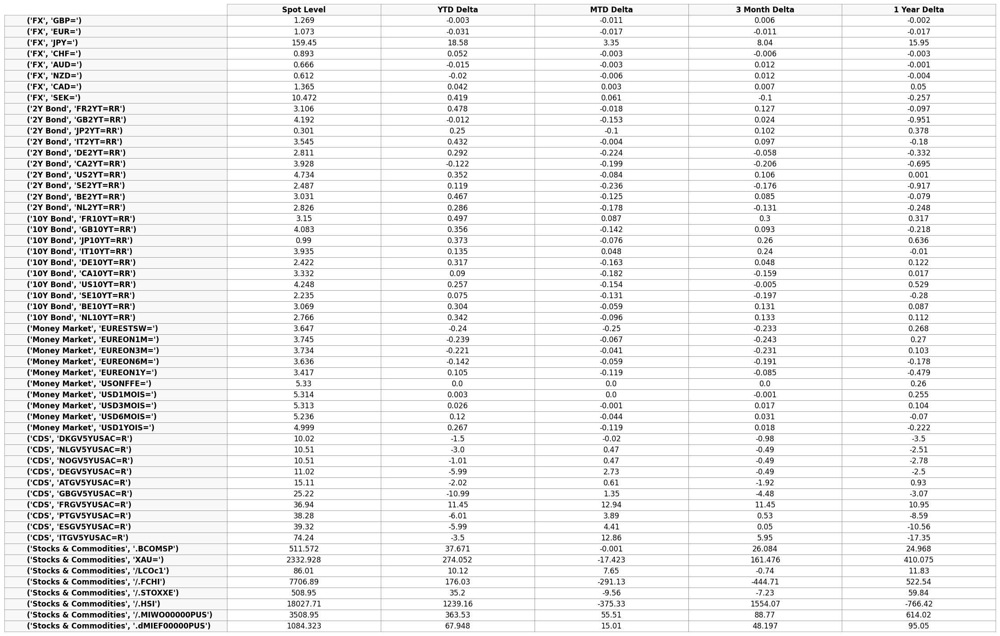

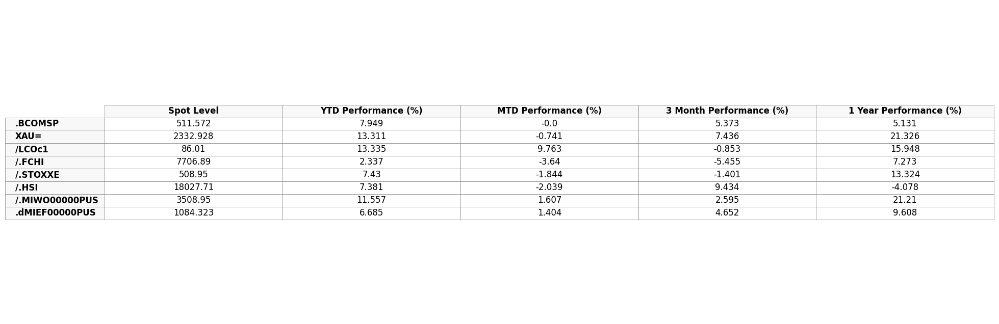

In [60]:
# Display the table using matplotlib
def plot_table(data):
    fig, ax = plt.subplots(figsize=(15, 8))  # Set the size of the figure

    # Hide axes
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    ax.set_frame_on(False)

    # Table
    table = ax.table(cellText=data.values, colLabels=data.columns, rowLabels=data.index, cellLoc='center', loc='center', colColours=["#f8f8f8"] * len(data.columns), rowColours=["#f8f8f8"] * len(data.index))

    # Table styling
    table.auto_set_font_size(False)
    table.set_fontsize(12)
    table.scale(1.5, 1.5)  # Scale the table

    # Cell styling
    for (i, j), cell in table.get_celld().items():
        cell.set_edgecolor('grey')
        cell.set_linewidth(0.5)
        if i == 0 or j == -1:
            cell.set_text_props(weight='bold', color='black')
            cell.set_facecolor('#f8f8f8')
    plt.show()

# Plot the table
plot_table(all_metrics)
plot_table(stock_commo_performance_metrics)

In [65]:
import os

def save_to_excel(dataframes, filename="performance_metrics.xlsx"):
    """
    Save multiple dataframes to a single Excel file with separate sheets.

    Parameters:
    dataframes (dict): A dictionary where keys are sheet names and values are the dataframes.
    filename (str): The name of the Excel file to save. Default is "performance_metrics.xlsx".
    """
    with pd.ExcelWriter(filename, engine='openpyxl') as writer:
        for sheet_name, df in dataframes.items():
            df.to_excel(writer, sheet_name=sheet_name)
    print(f"Data saved to {filename}")

    # Print the location of the saved file
    saved_file_path = os.path.abspath(filename)
    print(f"Data saved to {saved_file_path}")

# Consolidated file
performance_metrics = {
    "All Metrics": all_metrics,
    "Stock Commo Performance Metrics": stock_commo_performance_metrics
}

save_to_excel(performance_metrics)

Data saved to performance_metrics.xlsx
Data saved to /content/performance_metrics.xlsx


In [32]:
# Function to normalize data to a base level (e.g., 100)
def normalize_to_base(data, base_level=100):
    return data / data.iloc[0] * base_level

# Function to clip extreme values
def clip_extreme_values(data, lower_quantile=0.01, upper_quantile=0.99):
    lower_bound = data.quantile(lower_quantile)
    upper_bound = data.quantile(upper_quantile)
    return data.clip(lower_bound, upper_bound, axis=1)

# Function to plot multiple assets with enhancements
def plot_assets_with_enhancements(data, title="Time series of rates levels", base_level=100, lower_quantile=0.01, upper_quantile=0.99):
    # Normalize the data to the base level
    data_normalized = normalize_to_base(data, base_level)

    # Clip extreme values
    data_clipped = clip_extreme_values(data_normalized, lower_quantile, upper_quantile)

    plt.figure(figsize=(14, 7))

    # Create a color palette
    palette = sns.color_palette("viridis", len(data_clipped.columns))

    # Plot each series with a different color
    ax = data_clipped.plot(figsize=(14, 7), color=palette, linewidth=2)

    # Add labels and title
    ax.set_xlabel("Date", fontsize=14)
    ax.set_ylabel(f"Reindexed to {base_level}", fontsize=14)
    ax.set_title(title, fontsize=16)

    # Improve legend
    ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=12)

    # Add grid and make it look professional
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)

    # Tight layout for better spacing
    plt.tight_layout()
    plt.show()

<Figure size 1400x700 with 0 Axes>

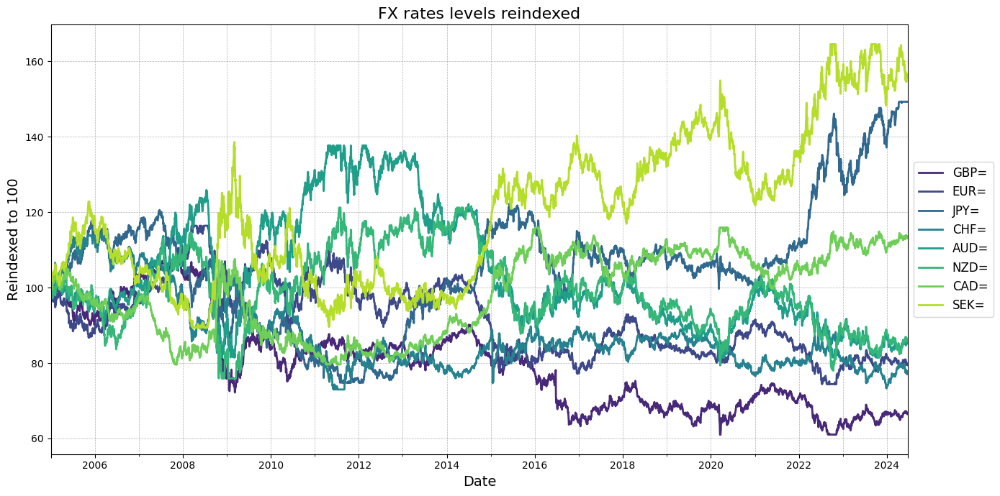

<Figure size 1400x700 with 0 Axes>

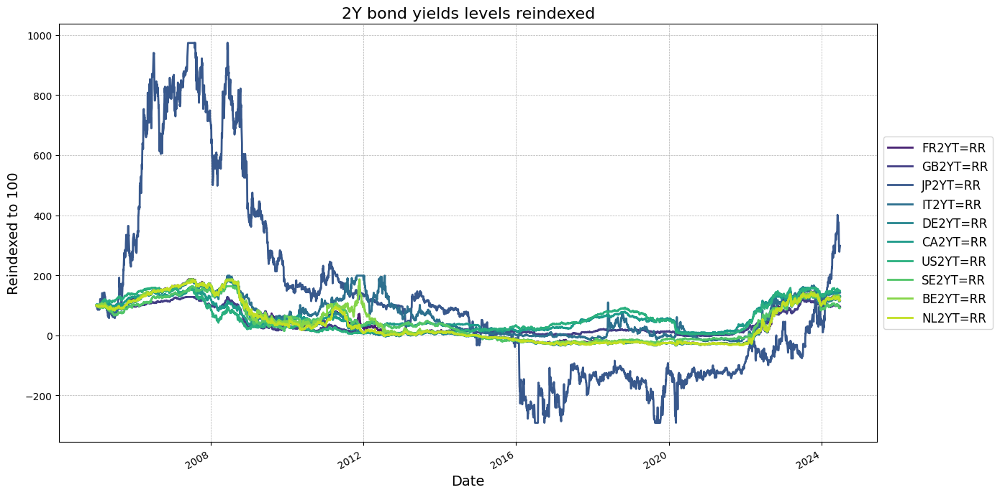

<Figure size 1400x700 with 0 Axes>

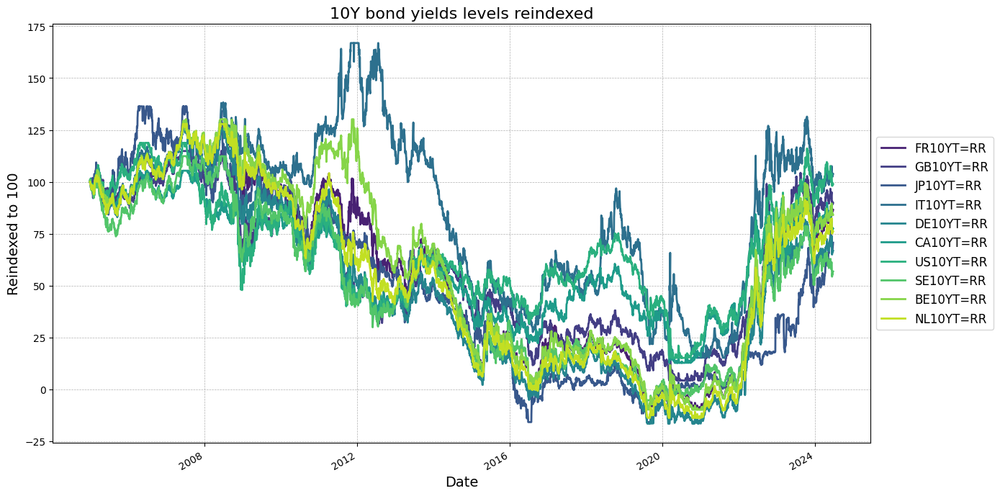

<Figure size 1400x700 with 0 Axes>

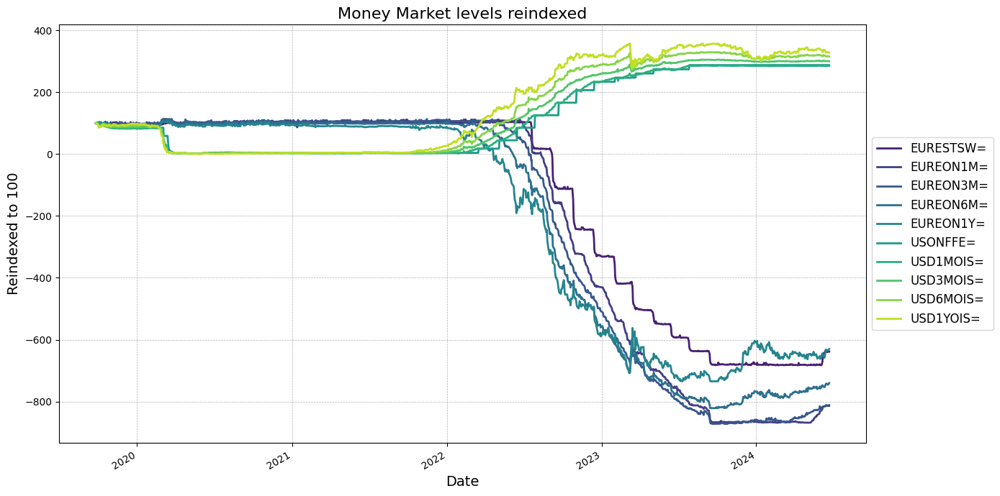

<Figure size 1400x700 with 0 Axes>

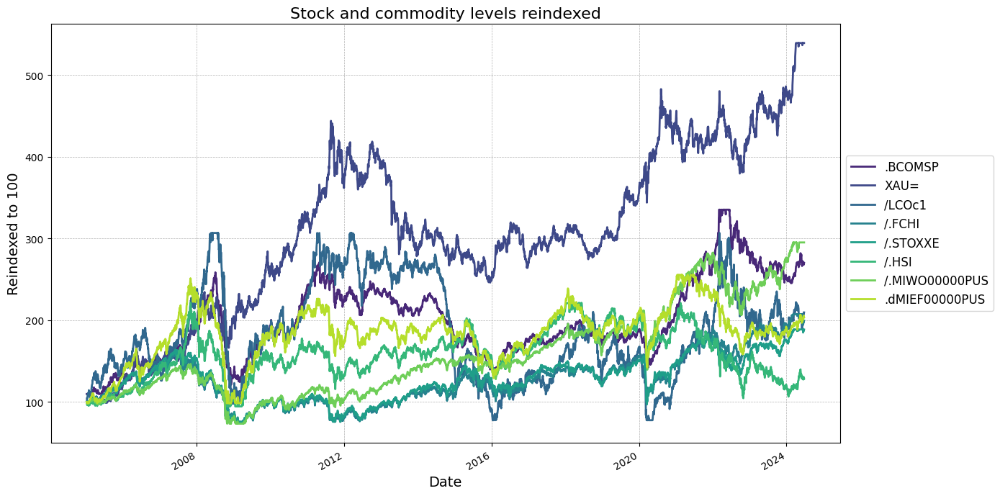

<Figure size 1400x700 with 0 Axes>

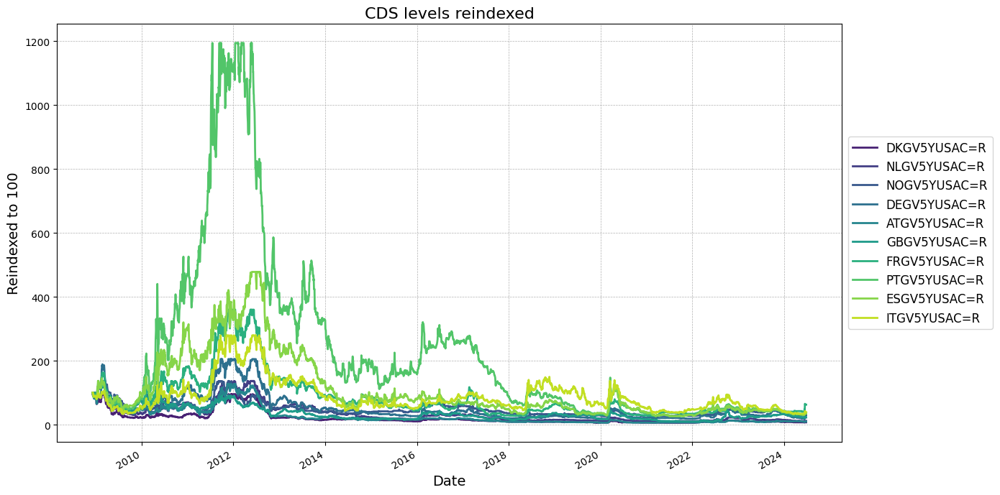

In [34]:
# Plot the data with enhancements and outlier removal
plot_assets_with_enhancements(FX_data, title="FX rates levels reindexed", base_level=100)
plot_assets_with_enhancements(Bond2Y_data, title="2Y bond yields levels reindexed", base_level=100)
plot_assets_with_enhancements(Bond10Y_data, title="10Y bond yields levels reindexed", base_level=100)
plot_assets_with_enhancements(MM_data, title="Money Market levels reindexed", base_level=100)
plot_assets_with_enhancements(Stock_commo_data, title="Stock and commodity levels reindexed", base_level=100)
plot_assets_with_enhancements(CDS_data, title="CDS levels reindexed", base_level=100)

In [35]:
# Function to plot time series with historical range, mean, and percentiles
def plot_time_series_with_enhancements(df, column, window_size):
    data = df[column].dropna()  # Drop NA values for the specific column
    rolling_min = data.rolling(window=window_size).min()
    rolling_max = data.rolling(window=window_size).max()
    mean_level = data.mean()
    percentile_25 = data.rolling(window=window_size).quantile(0.25)
    percentile_75 = data.rolling(window=window_size).quantile(0.75)

    plt.figure(figsize=(14, 7))
    plt.plot(data.index, data, label=f'{column} Level', color='blue')
    plt.fill_between(data.index, rolling_min, rolling_max, color='gray', alpha=0.3, label='Historical Range')
    plt.axhline(y=mean_level, color='red', linestyle='-', linewidth=2, label='Mean Level')
    plt.plot(data.index, percentile_25, color='green', linestyle='--', linewidth=1.5, label='25th Percentile')
    plt.plot(data.index, percentile_75, color='purple', linestyle='--', linewidth=1.5, label='75th Percentile')

    plt.title(f'{column} with Historical range, mean, and percentiles ({window_size} days window)')
    plt.xlabel('Date')
    plt.ylabel('Level')
    plt.legend()
    plt.grid(True)
    plt.show()

# Set the window size for the rolling calculation
window_size = 180  # number of days

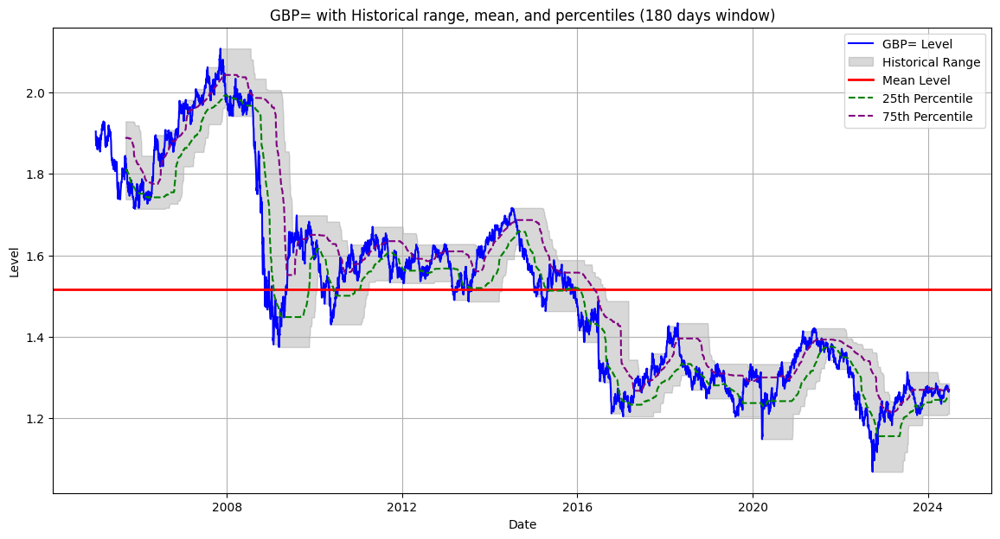

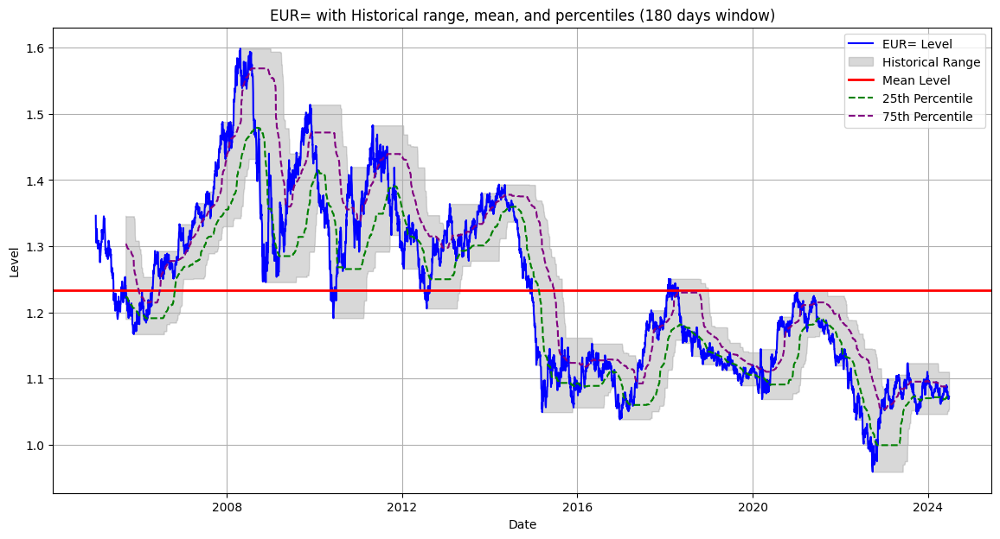

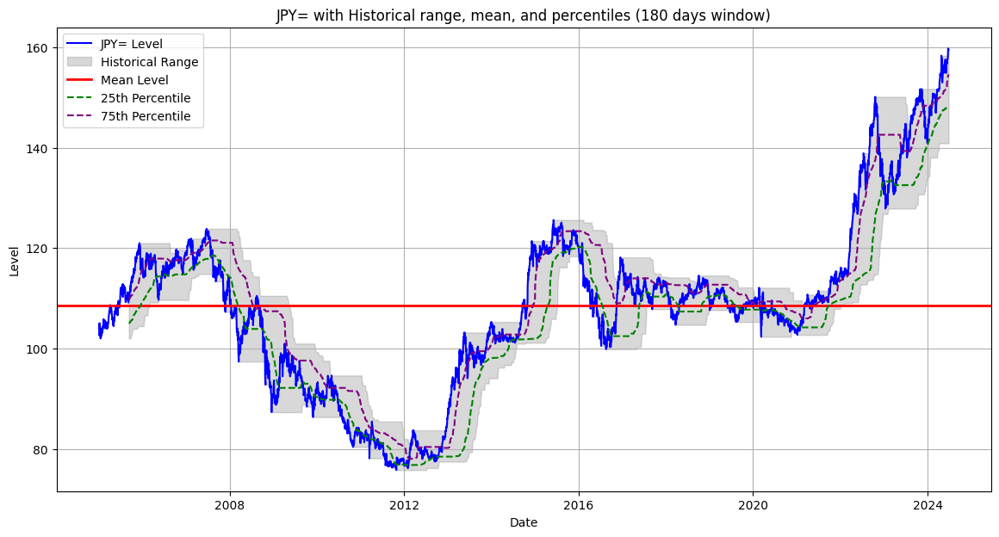

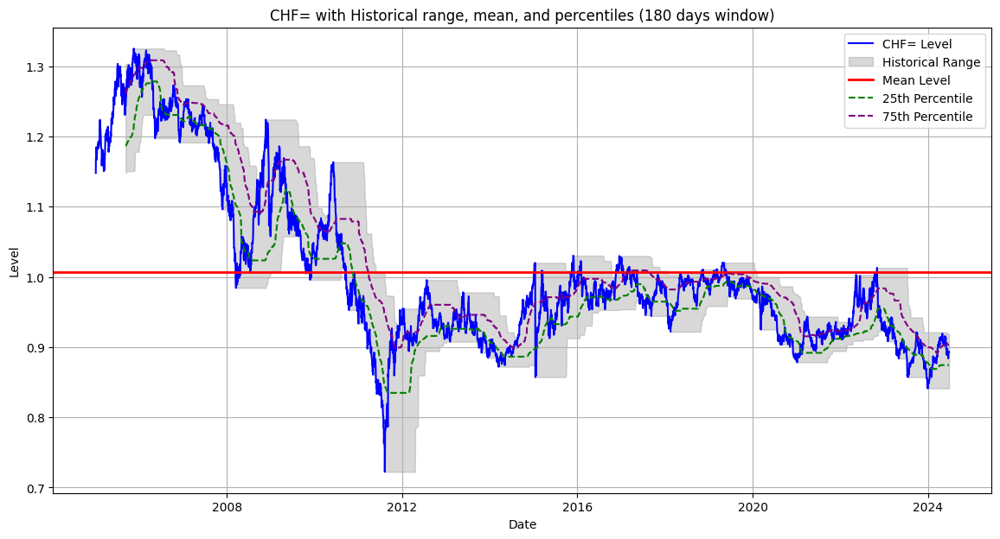

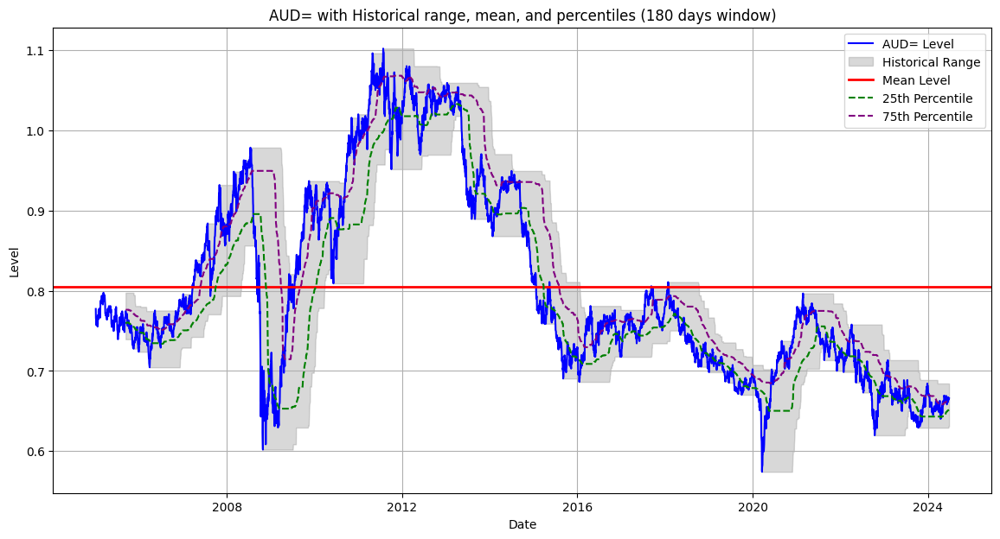

...

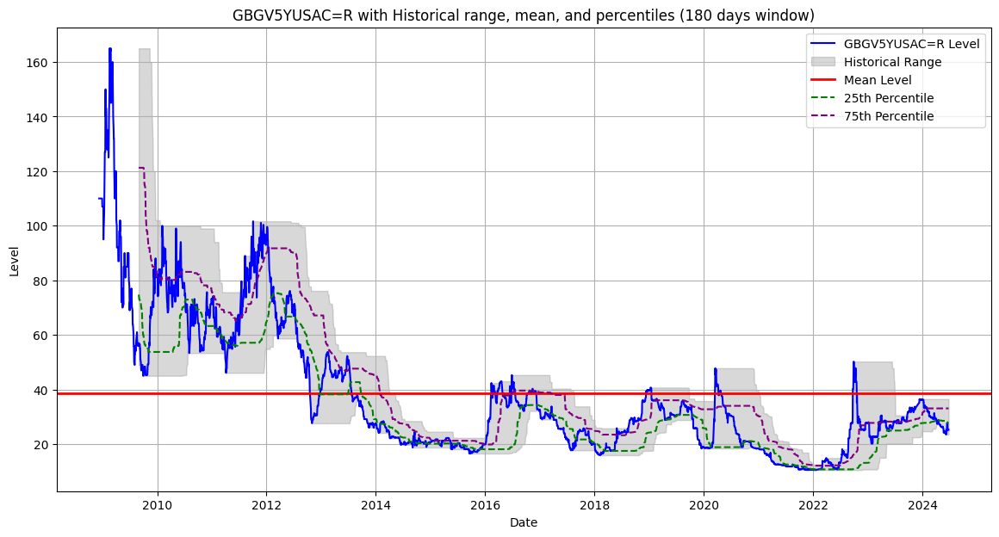

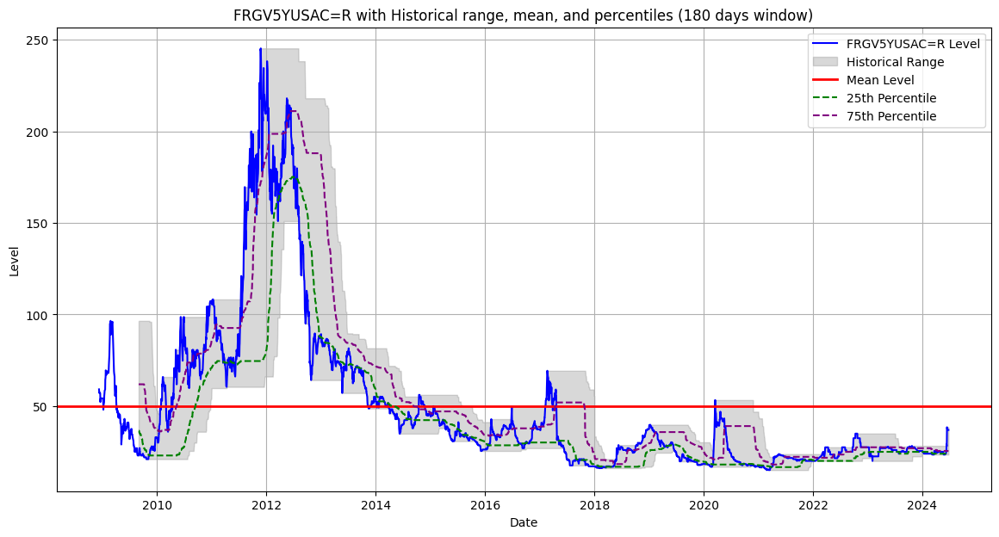

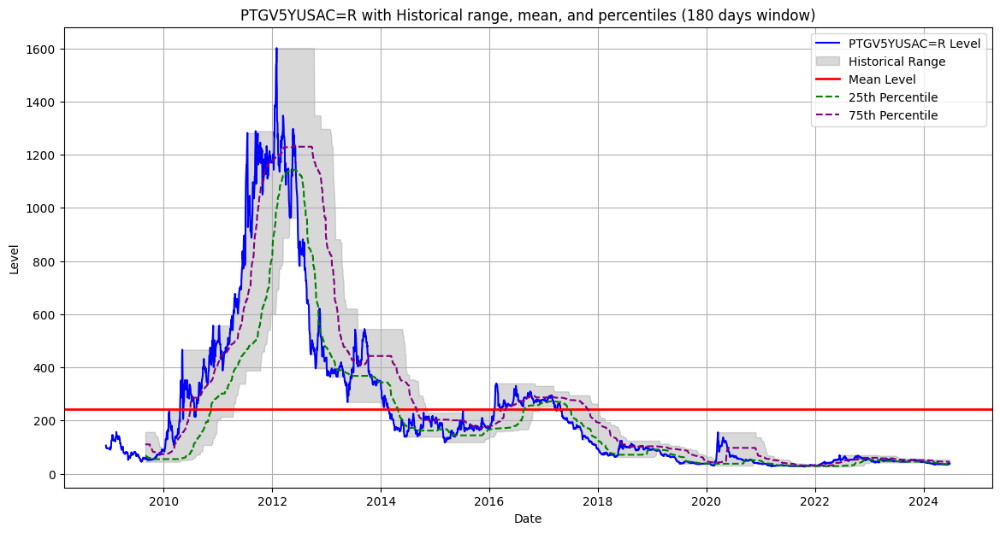

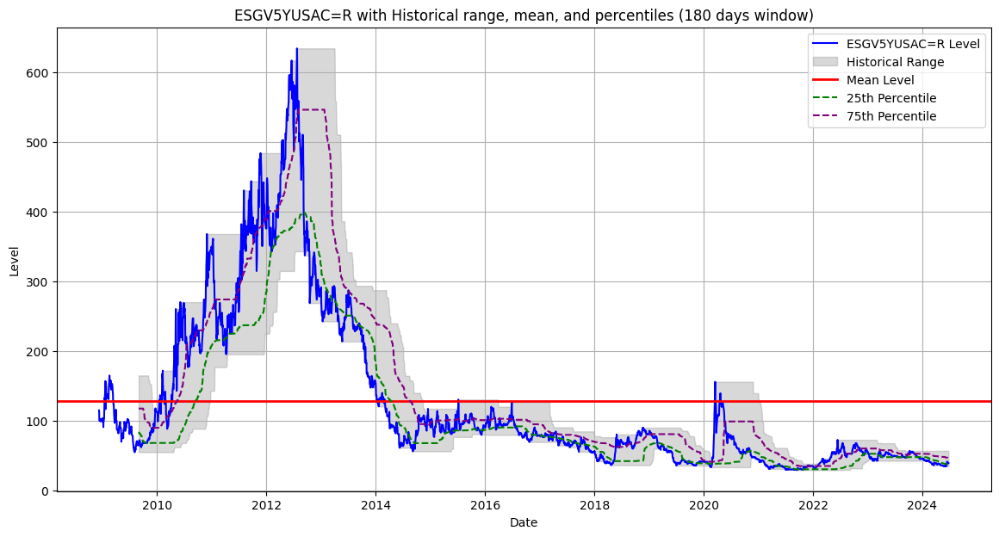

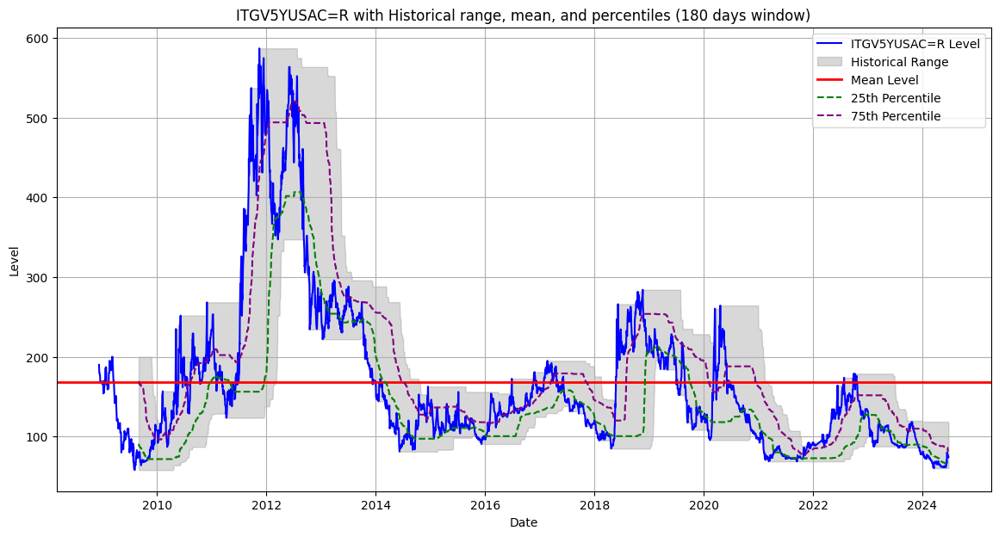

In [36]:
# Plot analysis with historical range for FX data
for column in FX_data.columns:
    plot_time_series_with_enhancements(FX_data, column,window_size)

# Plot analysis with historical range for rates data (2Y yields)
for column in Bond2Y_data.columns:
    plot_time_series_with_enhancements(Bond2Y_data, column, window_size)

# Plot analysis with historical range for rates data (10y yields)
for column in Bond10Y_data.columns:
    plot_time_series_with_enhancements(Bond10Y_data, column, window_size)

# Plot analysis with historical range for money market rates data
for column in MM_data.columns:
    plot_time_series_with_enhancements(MM_data, column, window_size)

# Plot analysis with historical range for Rates data
for column in Stock_commo_data.columns:
    plot_time_series_with_enhancements(Stock_commo_data, column, window_size)

# Plot analysis with historical range for CDS data
for column in CDS_data.columns:
    plot_time_series_with_enhancements(CDS_data, column, window_size)

In [38]:
# Function to plot distribution with enhancements
def plot_distribution_with_enhancements(df, column):
    data = df[column].dropna()  # Drop NA values for the specific column
    mean = data.mean()
    median = data.median()
    std_dev = data.std()

    plt.figure(figsize=(14, 7))

    # Histogram
    sns.histplot(data, bins=50, kde=True, color='blue', alpha=0.6)

    # Mean and median lines
    plt.axvline(mean, color='red', linestyle='-', linewidth=2, label=f'Mean: {mean:.2f}')
    plt.axvline(median, color='green', linestyle='--', linewidth=2, label=f'Median: {median:.2f}')

    # Annotations
    plt.title(f'Distribution of {column} level', fontsize=16)
    plt.xlabel('Returns', fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.legend()
    plt.grid(True)
    plt.show()

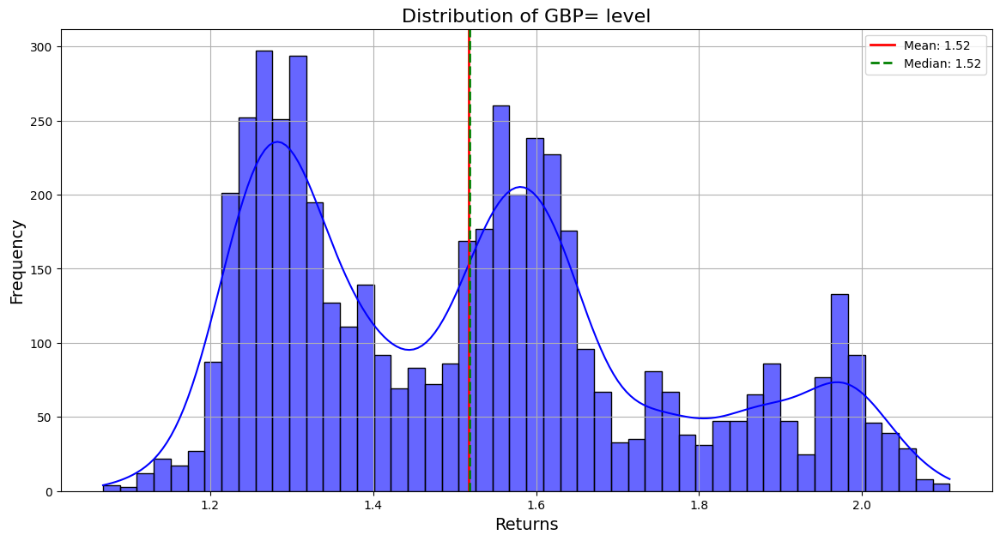

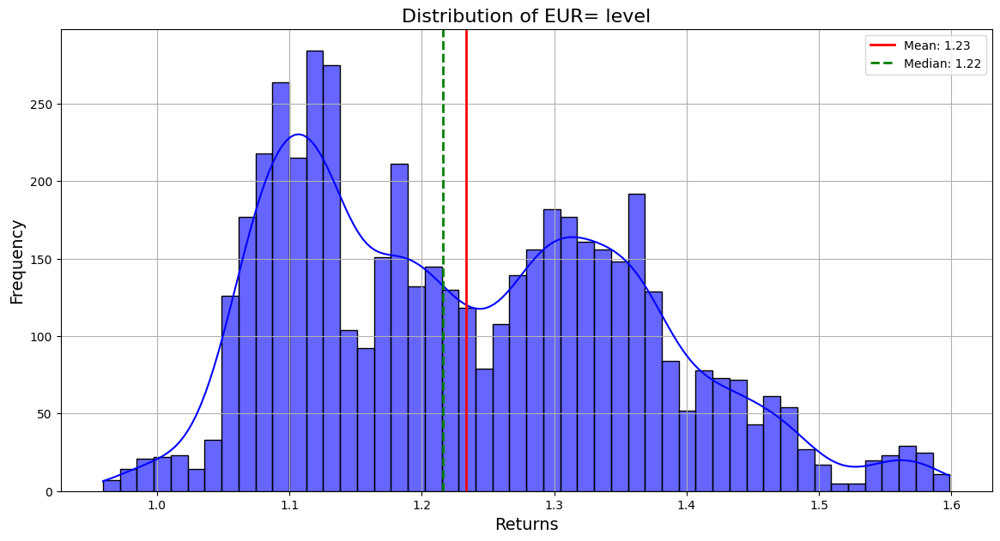

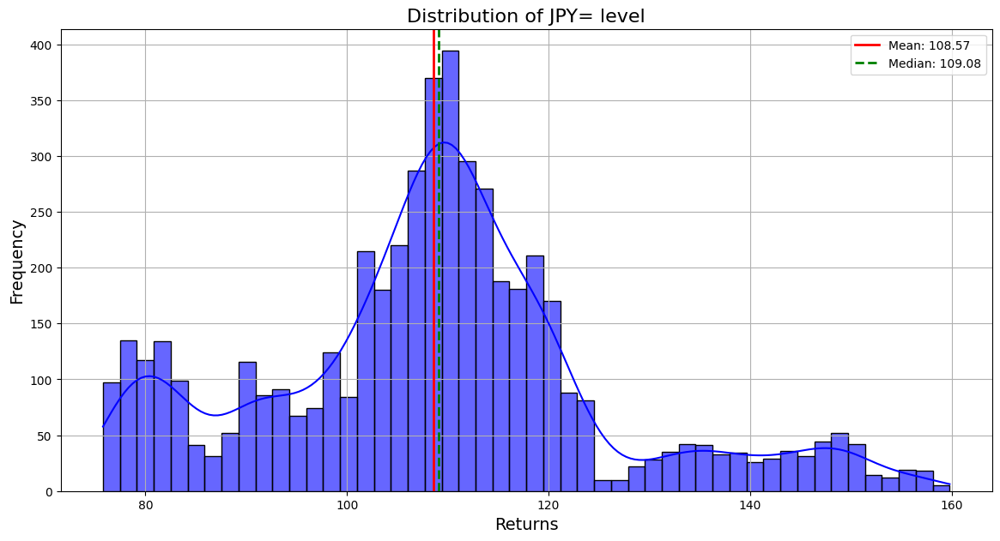

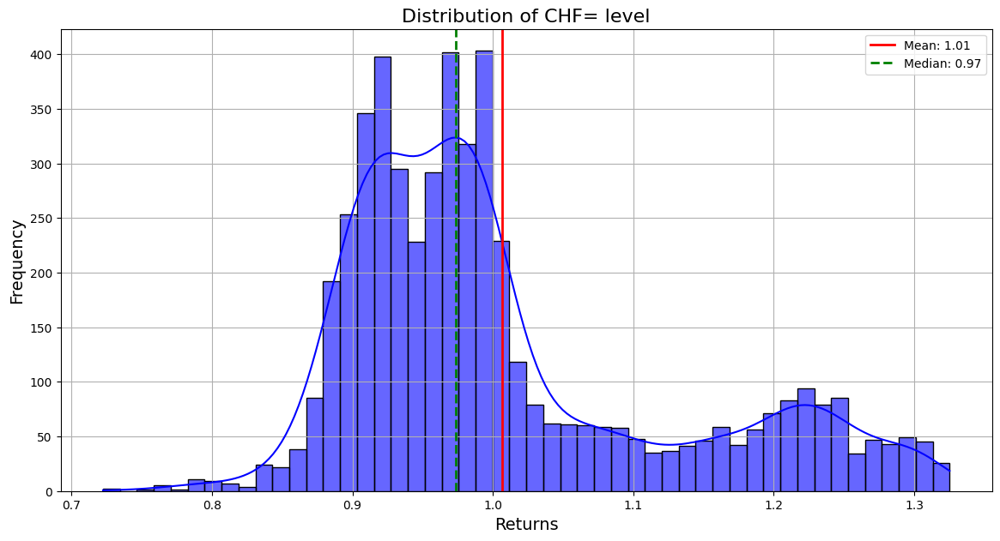

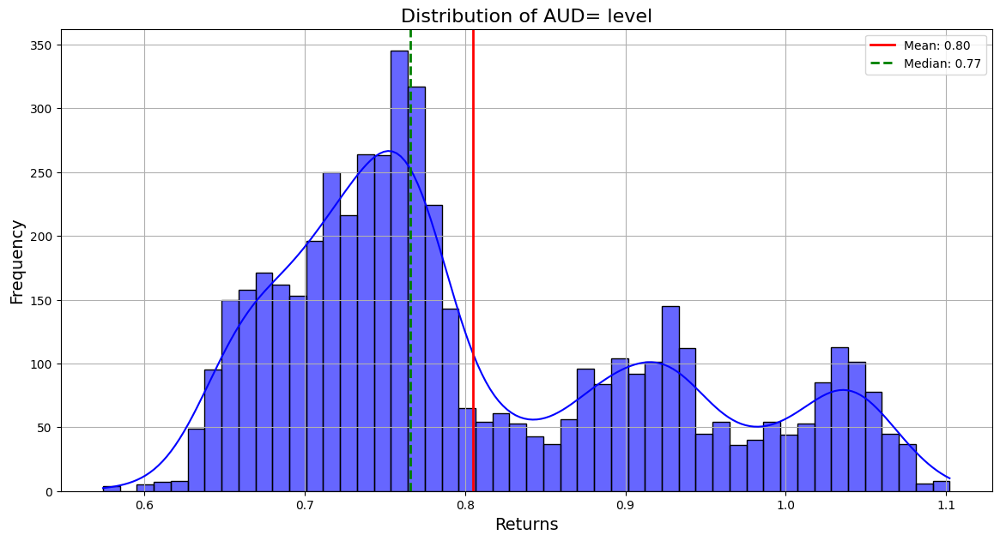

...

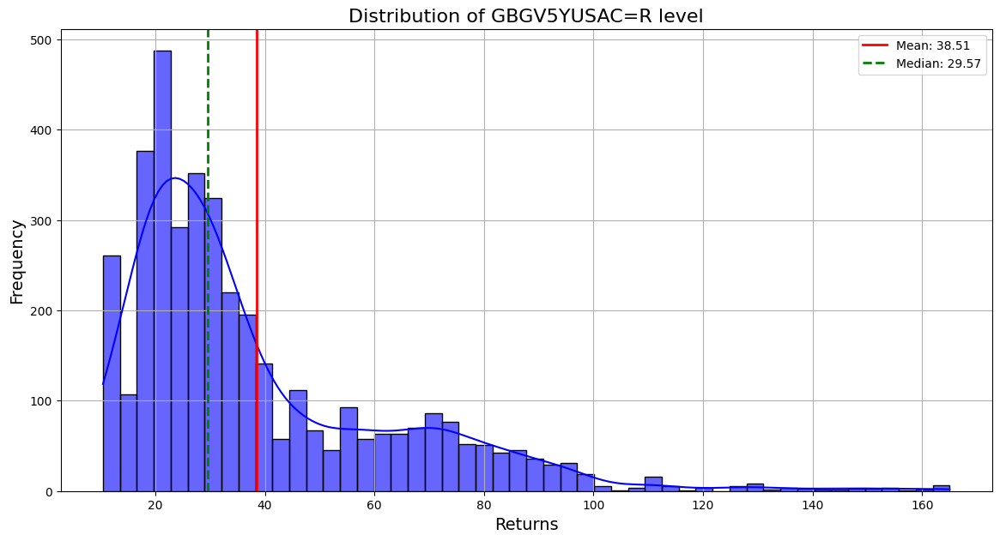

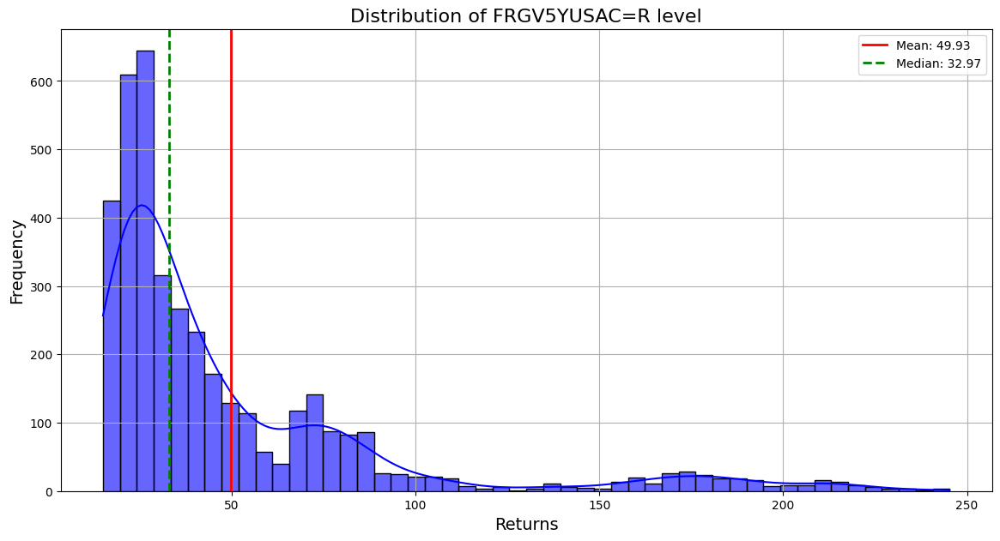

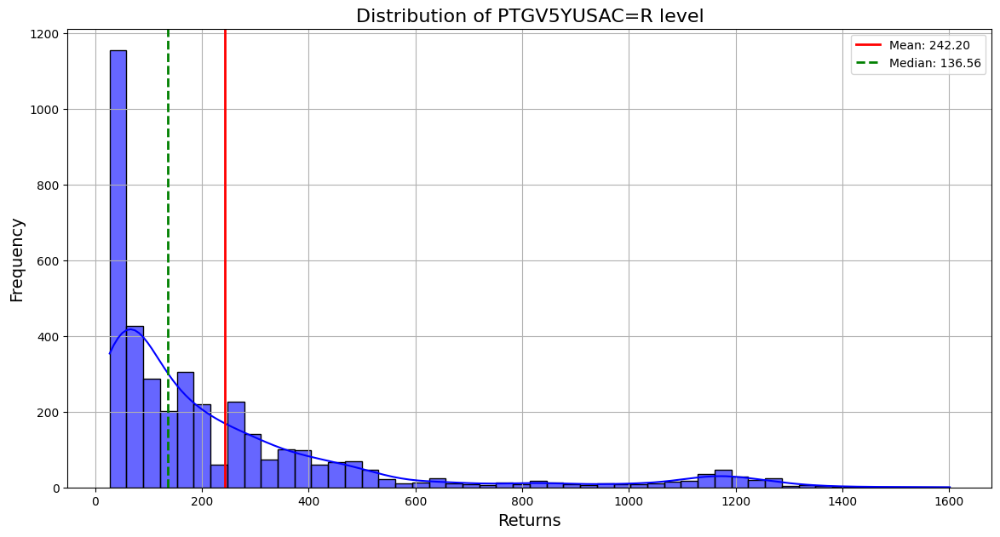

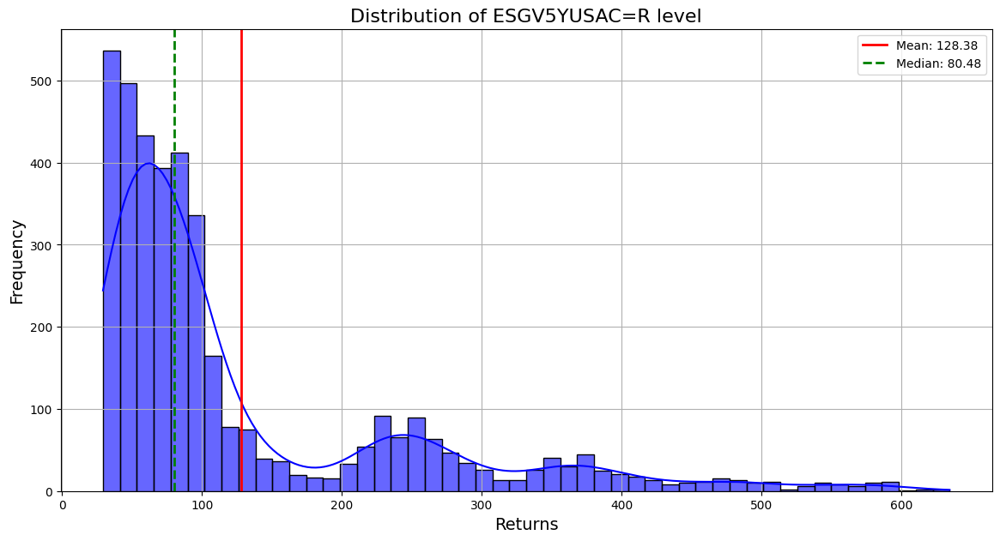

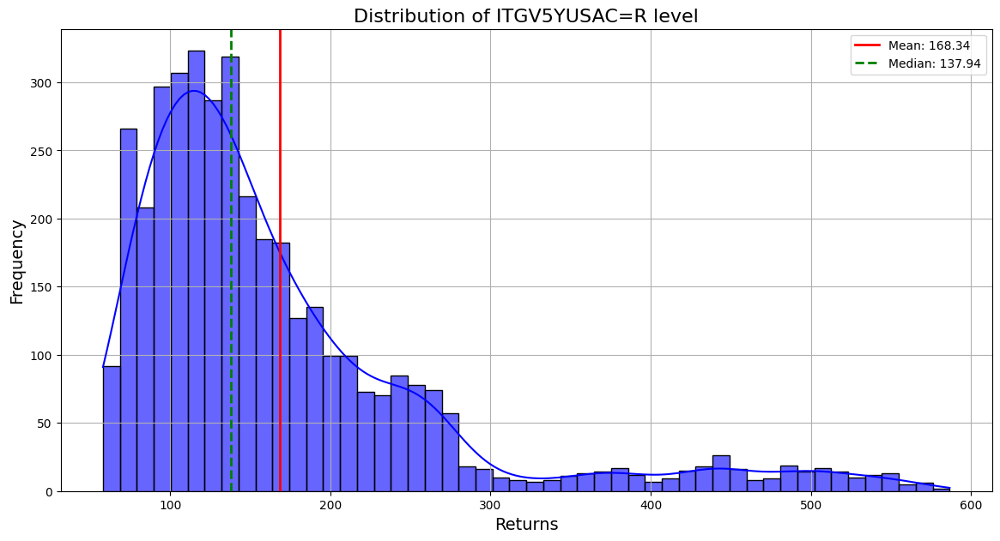

In [39]:
# Plot analysis with historical range for FX data
for column in FX_data.columns:
    plot_distribution_with_enhancements(FX_data, column)

# Plot analysis with historical range for rates data (2Y yields)
for column in Bond2Y_data.columns:
    plot_distribution_with_enhancements(Bond2Y_data, column)

# Plot analysis with historical range for rates data (10y yields)
for column in Bond10Y_data.columns:
    plot_distribution_with_enhancements(Bond10Y_data, column)

# Plot analysis with historical range for money market rates data
for column in MM_data.columns:
    plot_distribution_with_enhancements(MM_data, column)

# Plot analysis with historical range for Rates data
for column in Stock_commo_data.columns:
    plot_distribution_with_enhancements(Stock_commo_data, column)

# Plot analysis with historical range for CDS data
for column in CDS_data.columns:
    plot_distribution_with_enhancements(CDS_data, column)


Correlation analysis - YTD

FX Data


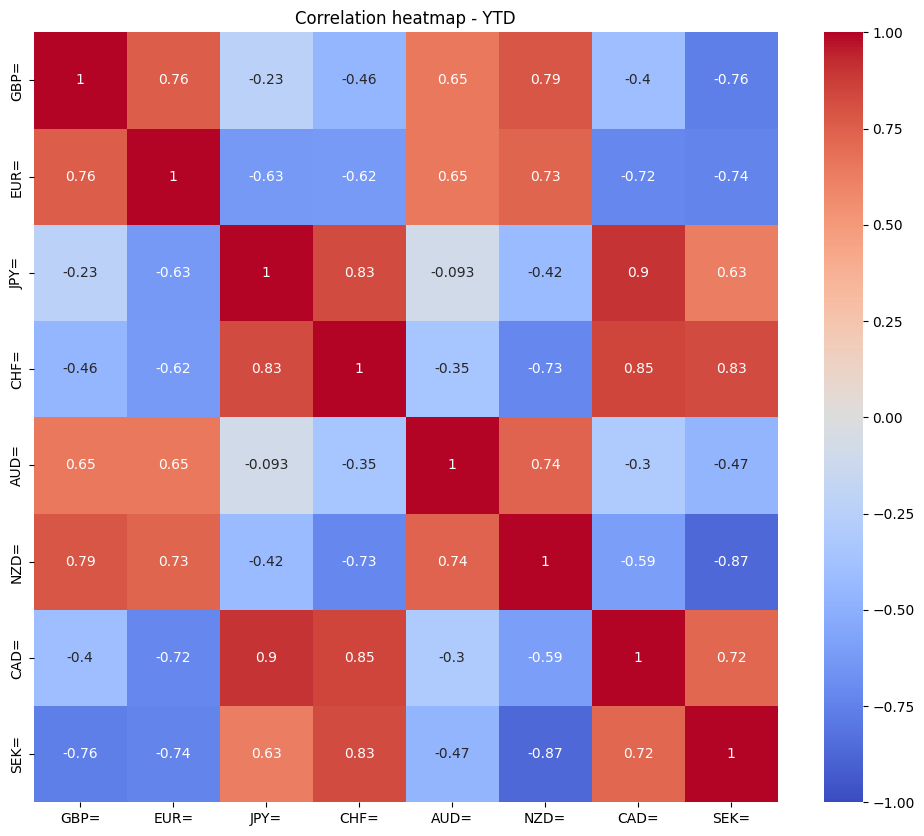


Bond2Y Data


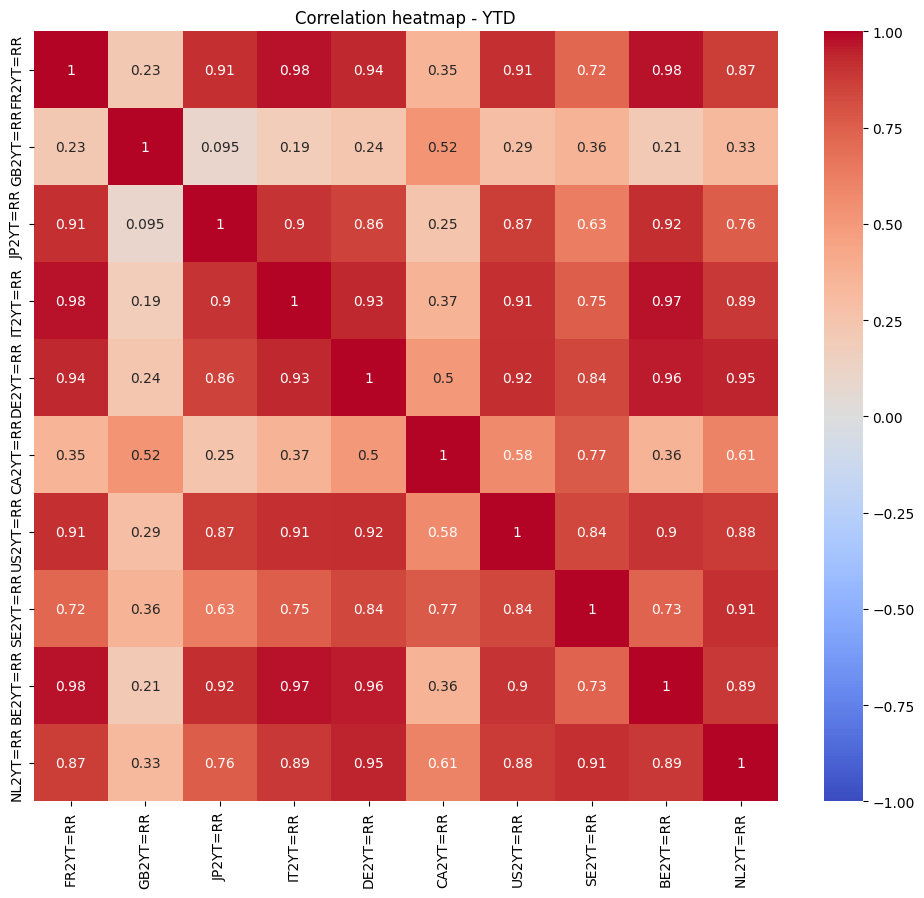


Bond10Y Data


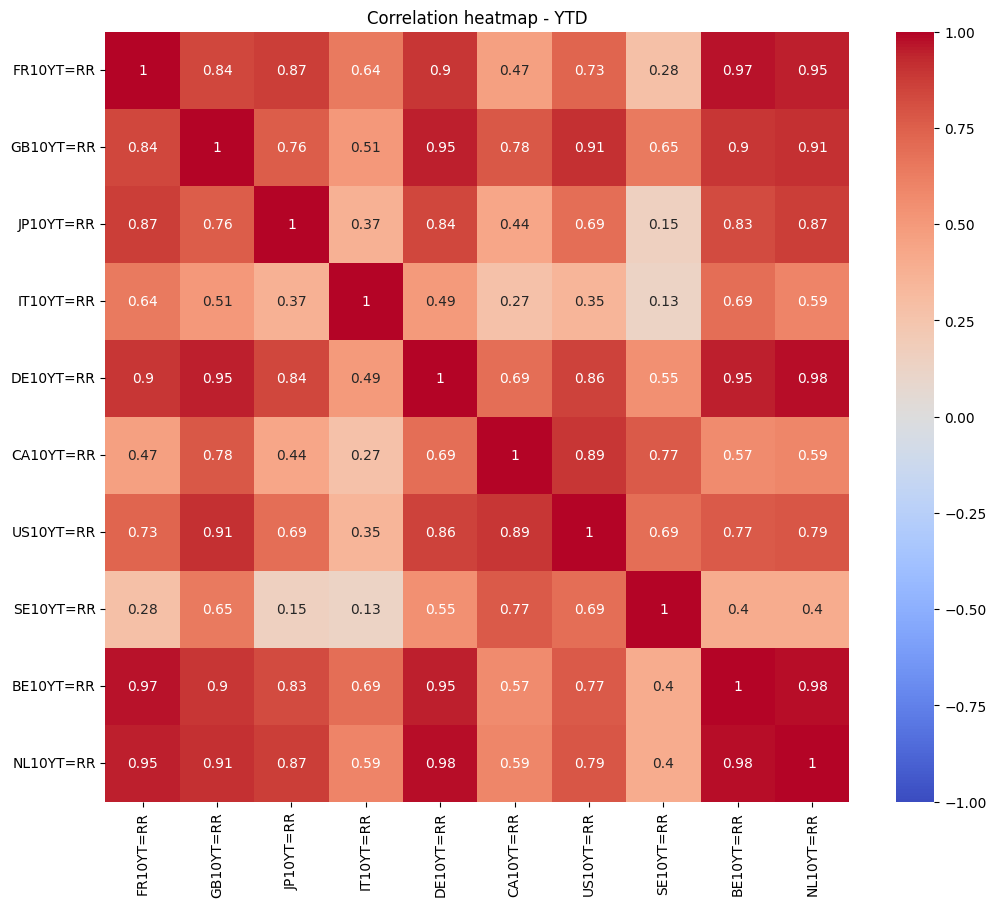


MM Data


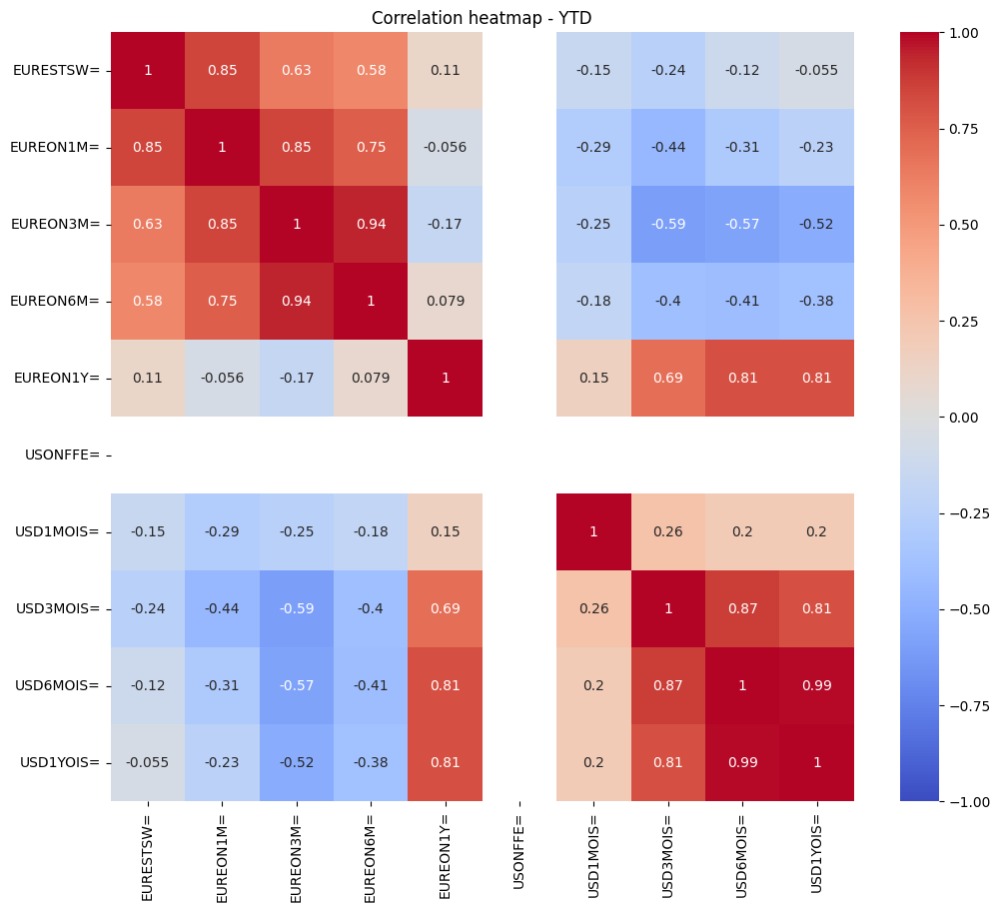


StockCommo Data


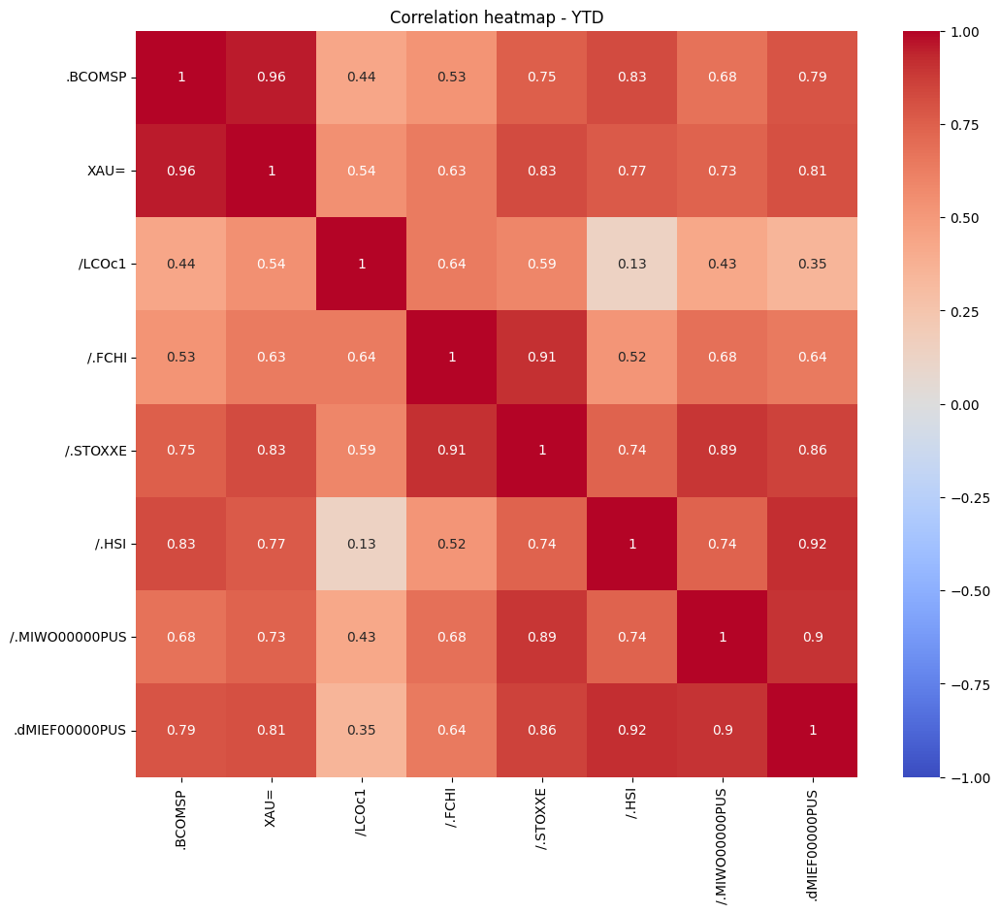


CDS Data


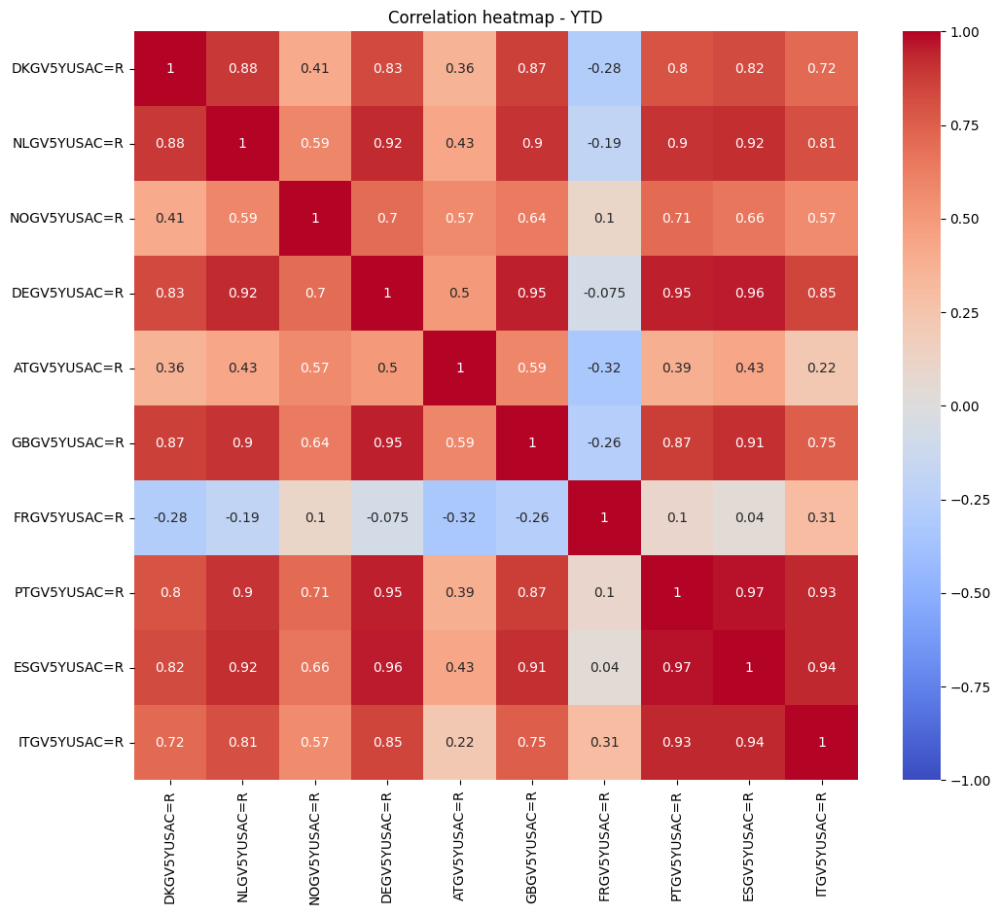


Correlation analysis - 3M

FX Data


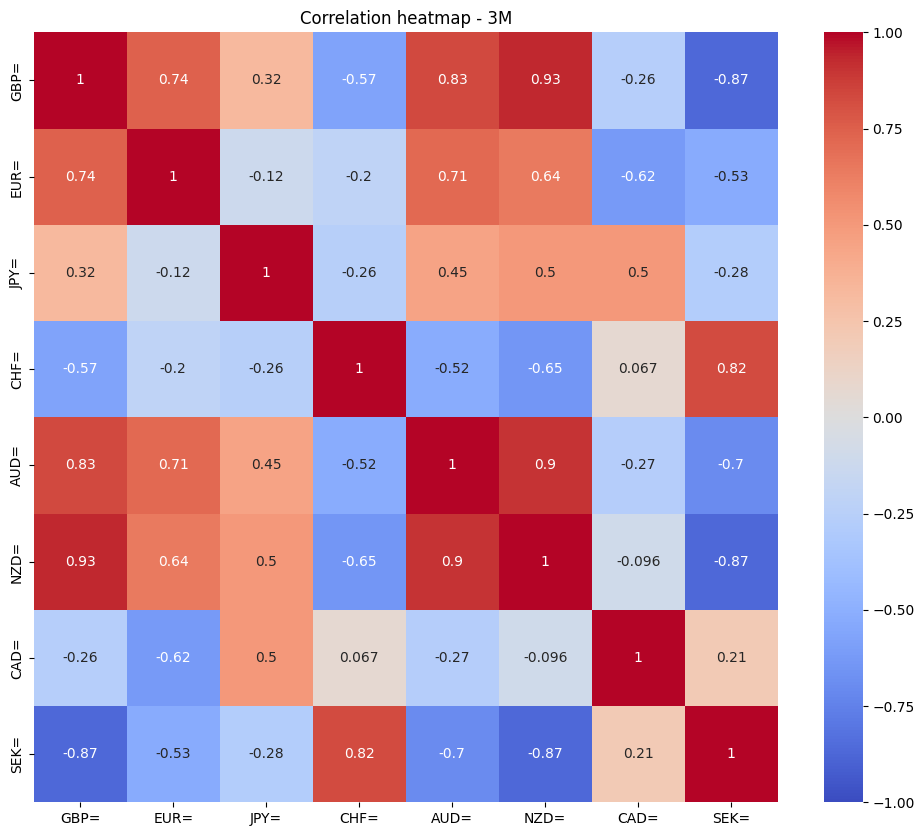


Bond2Y Data


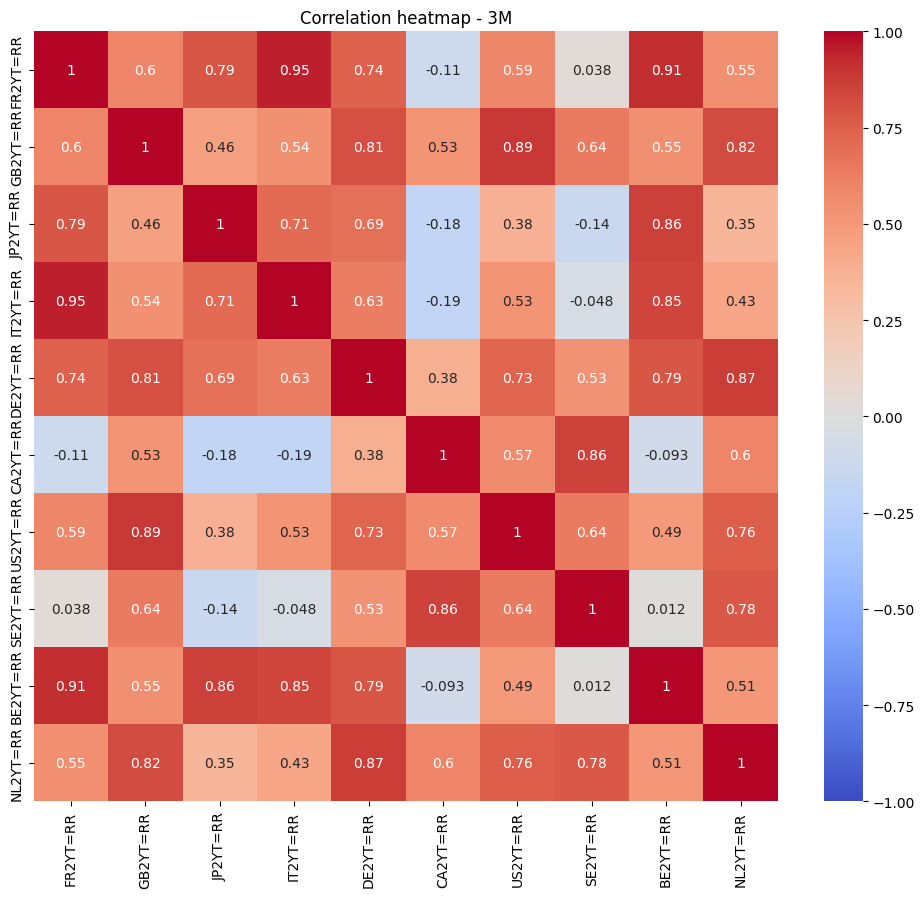


Bond10Y Data


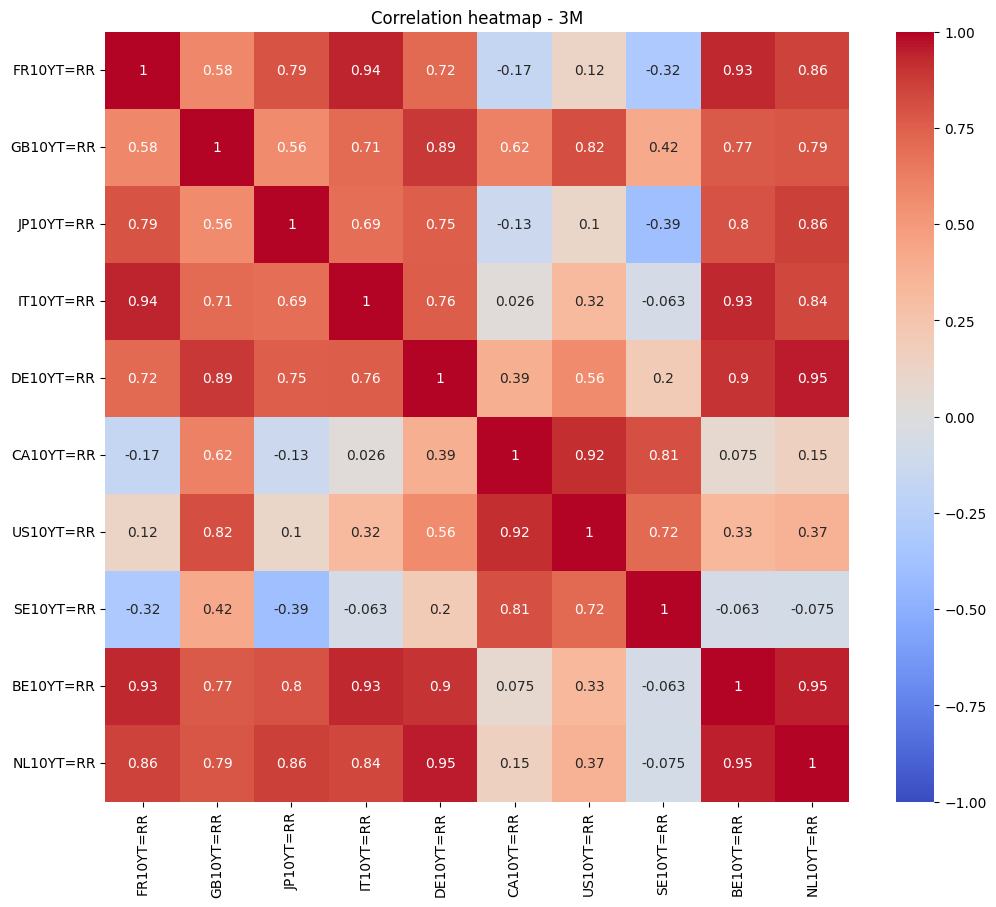


MM Data


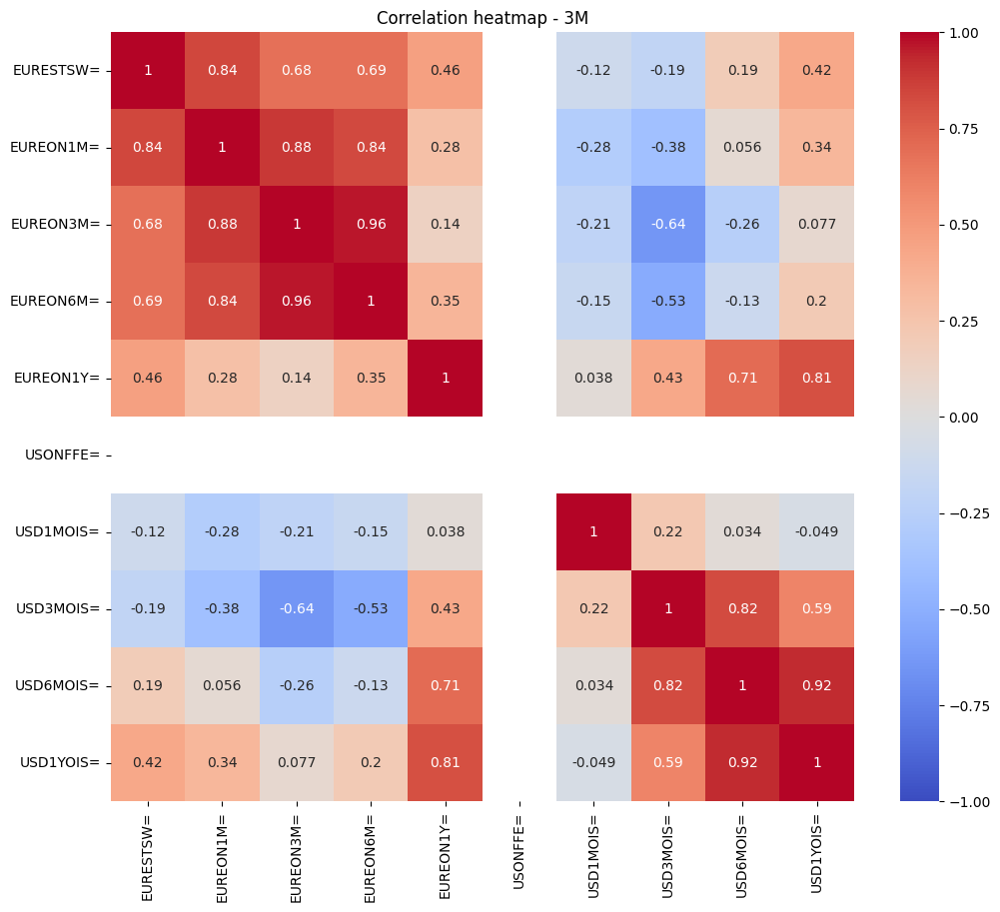


StockCommo Data


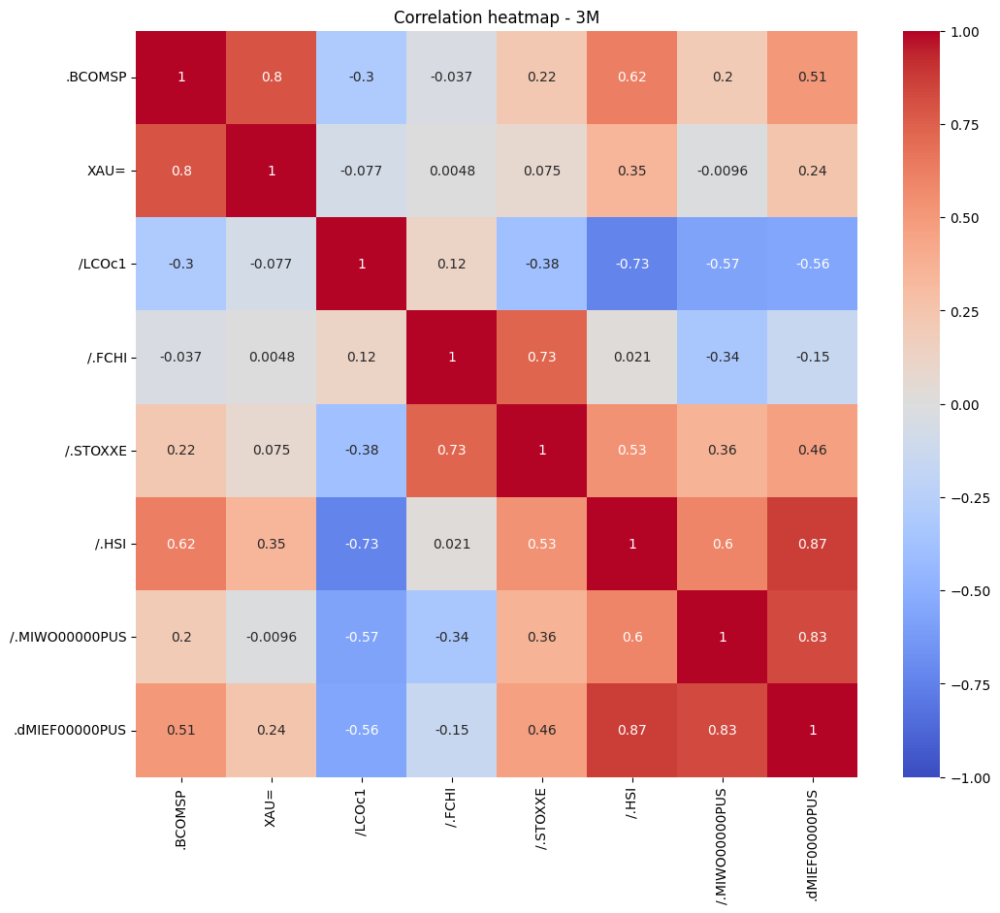


CDS Data


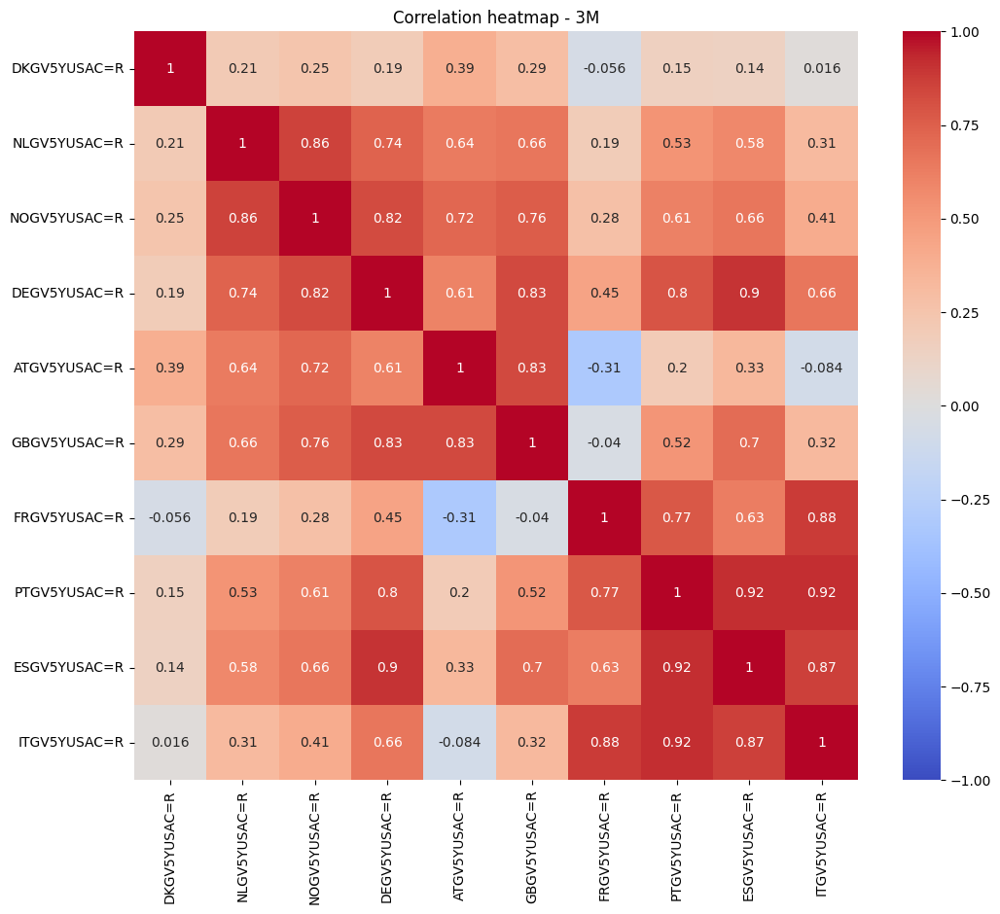


Correlation analysis - 1Y

FX Data


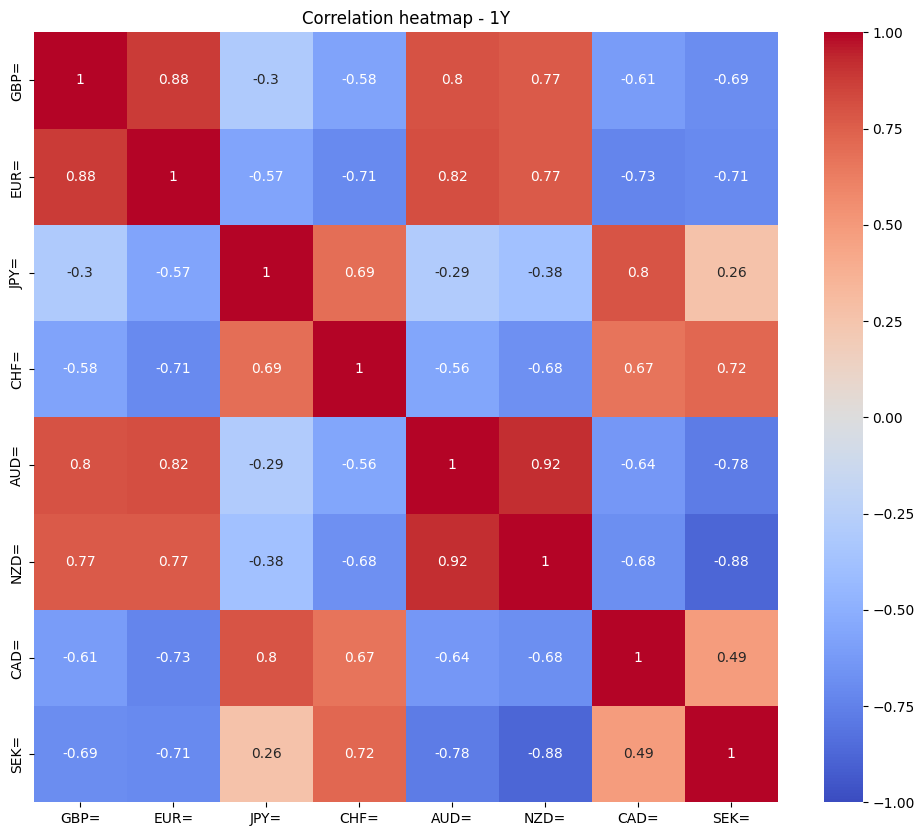


Bond2Y Data


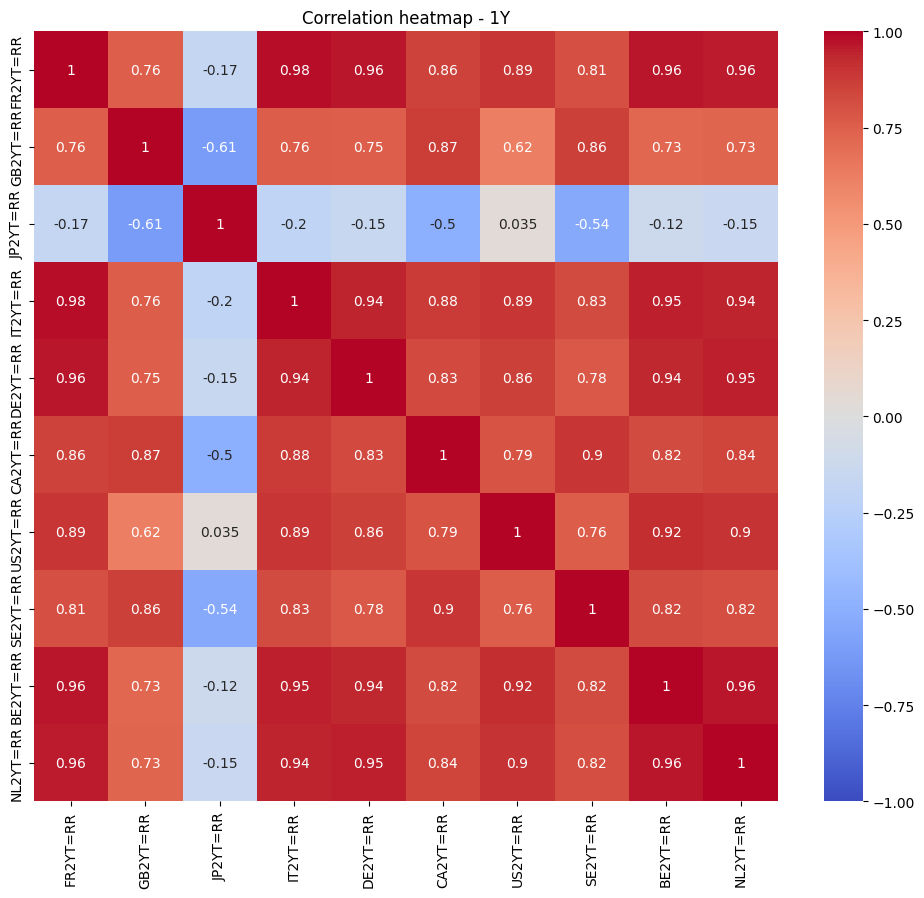


Bond10Y Data


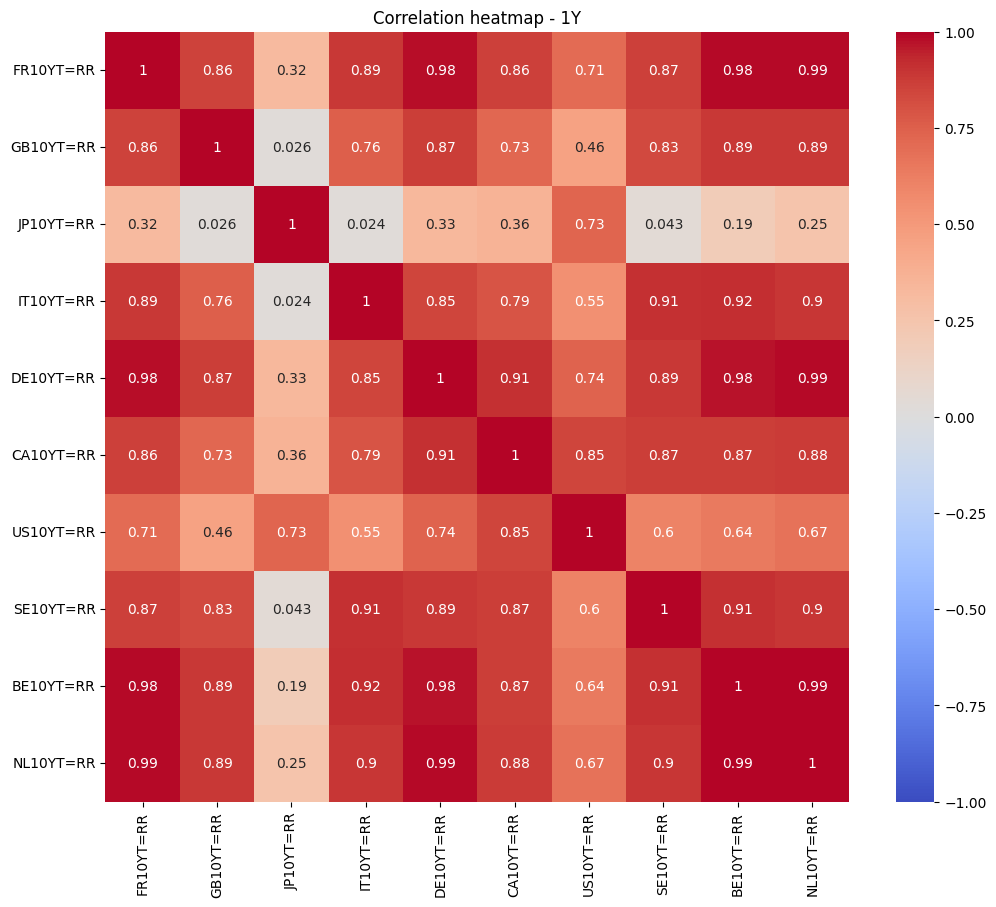


MM Data


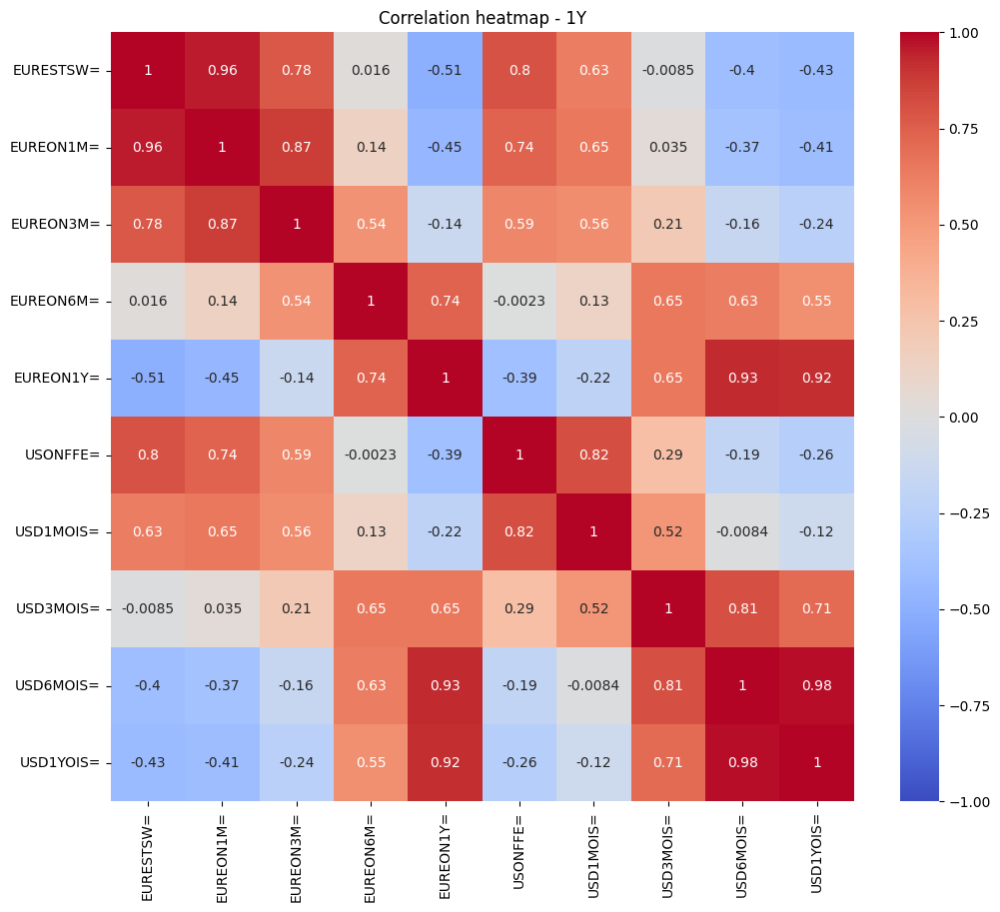


StockCommo Data


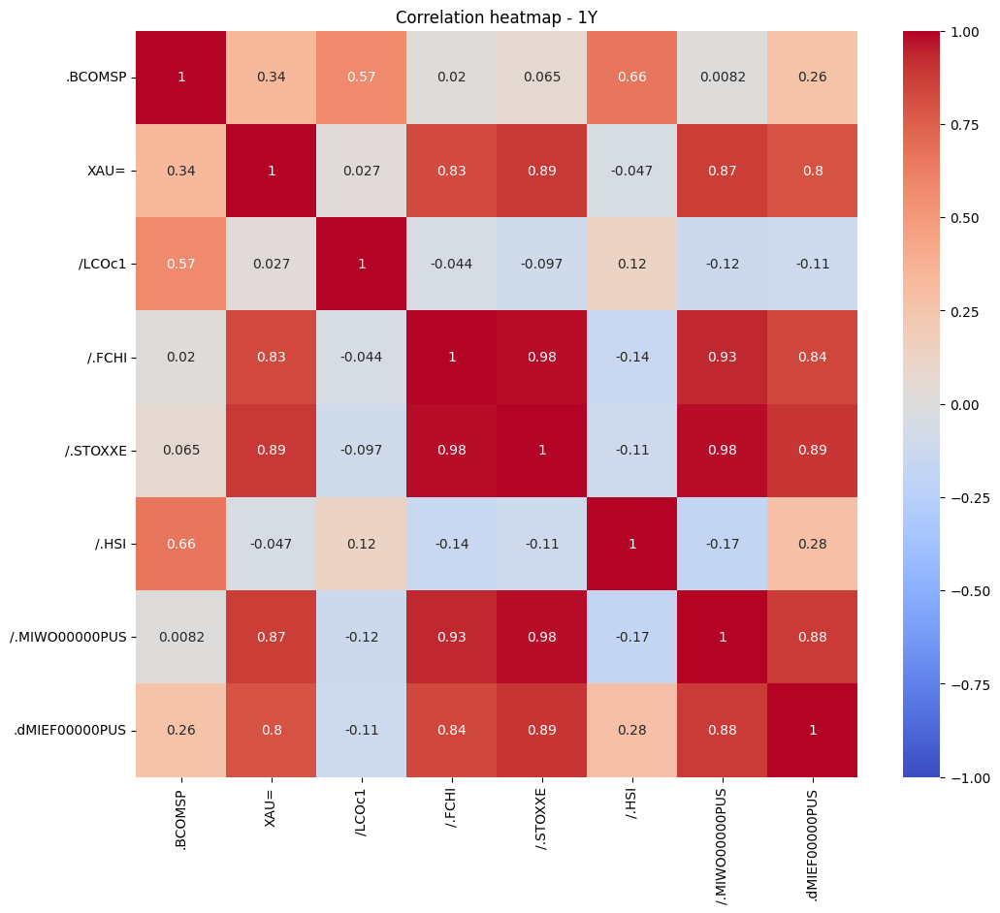


CDS Data


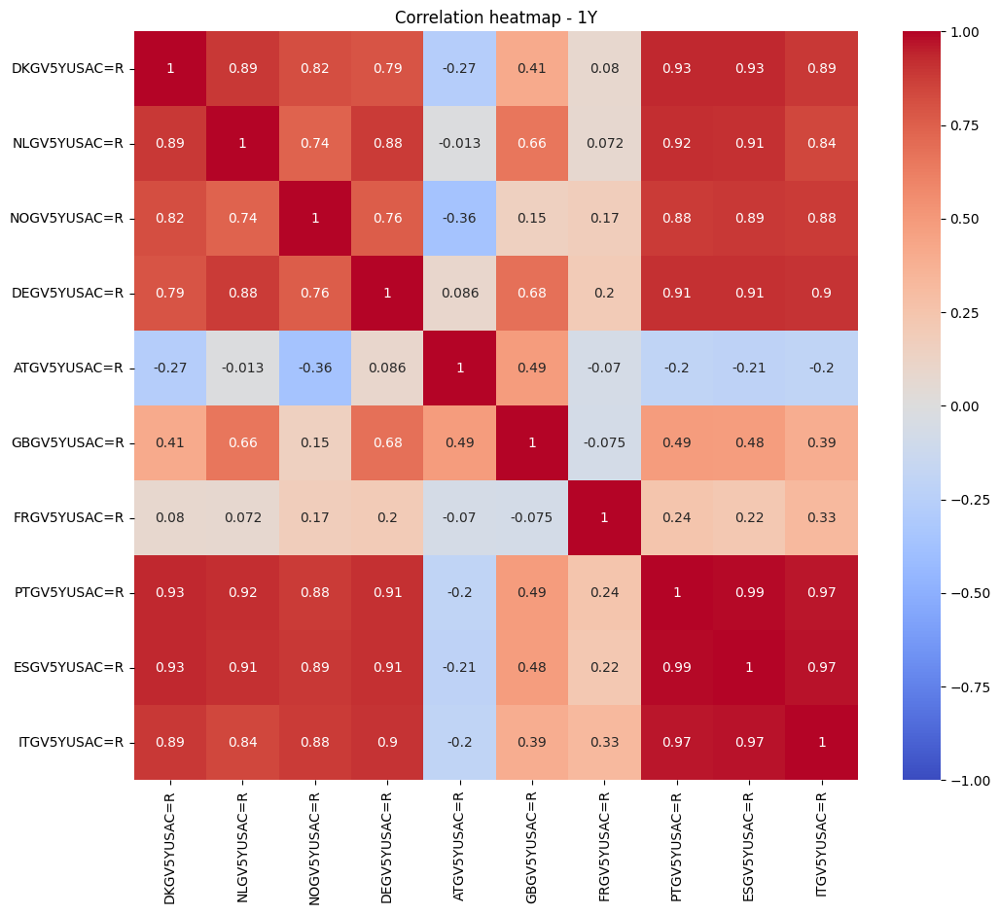


Correlation analysis - All Time

FX Data


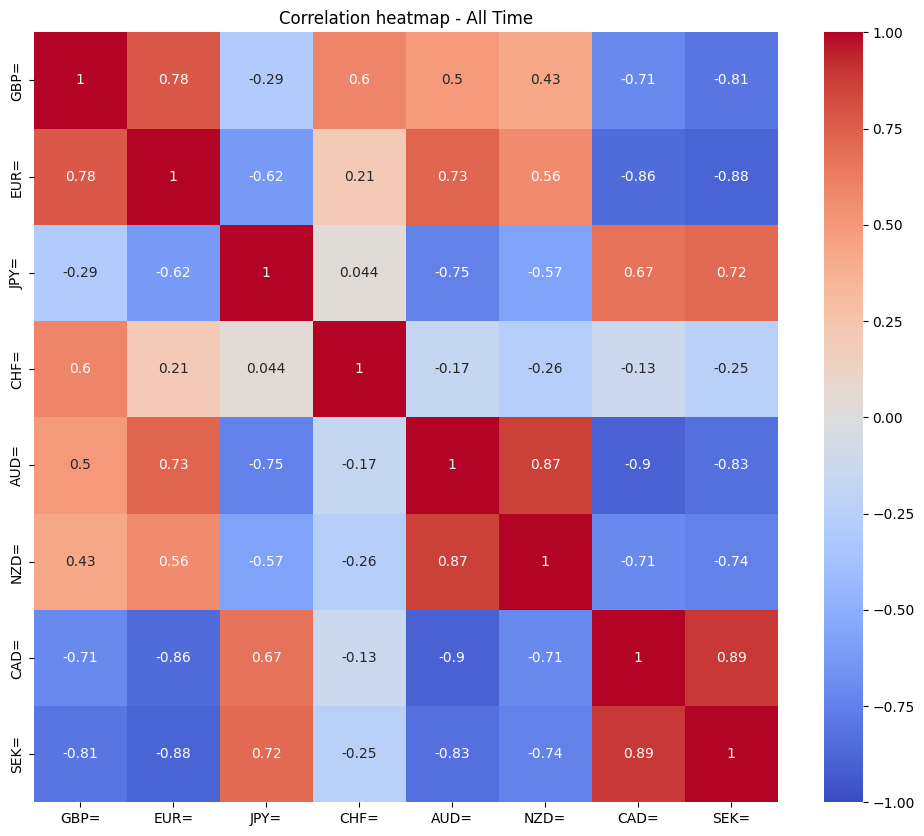


Bond2Y Data


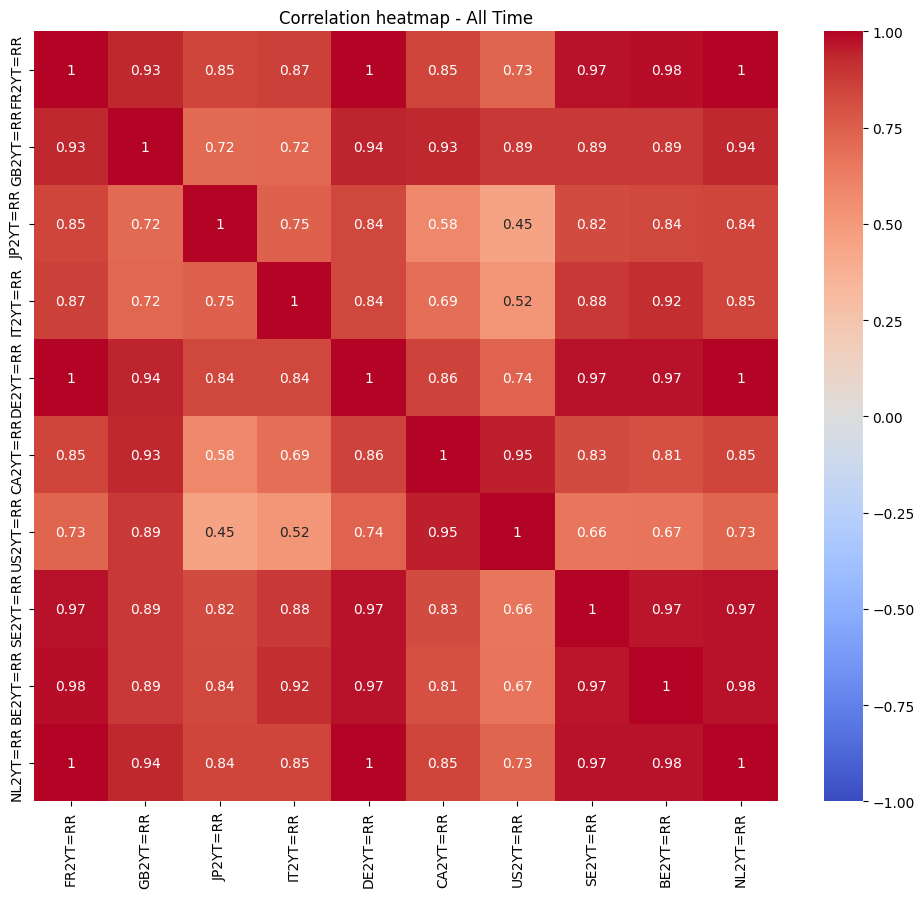


Bond10Y Data


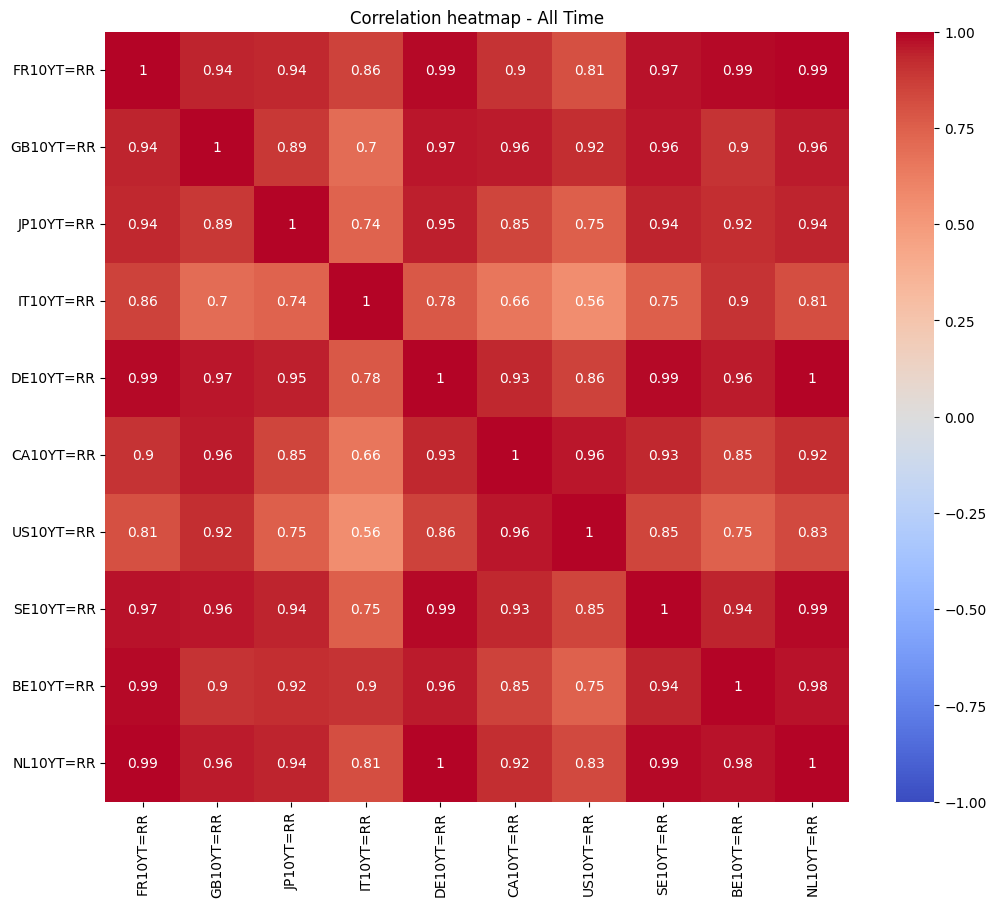


MM Data


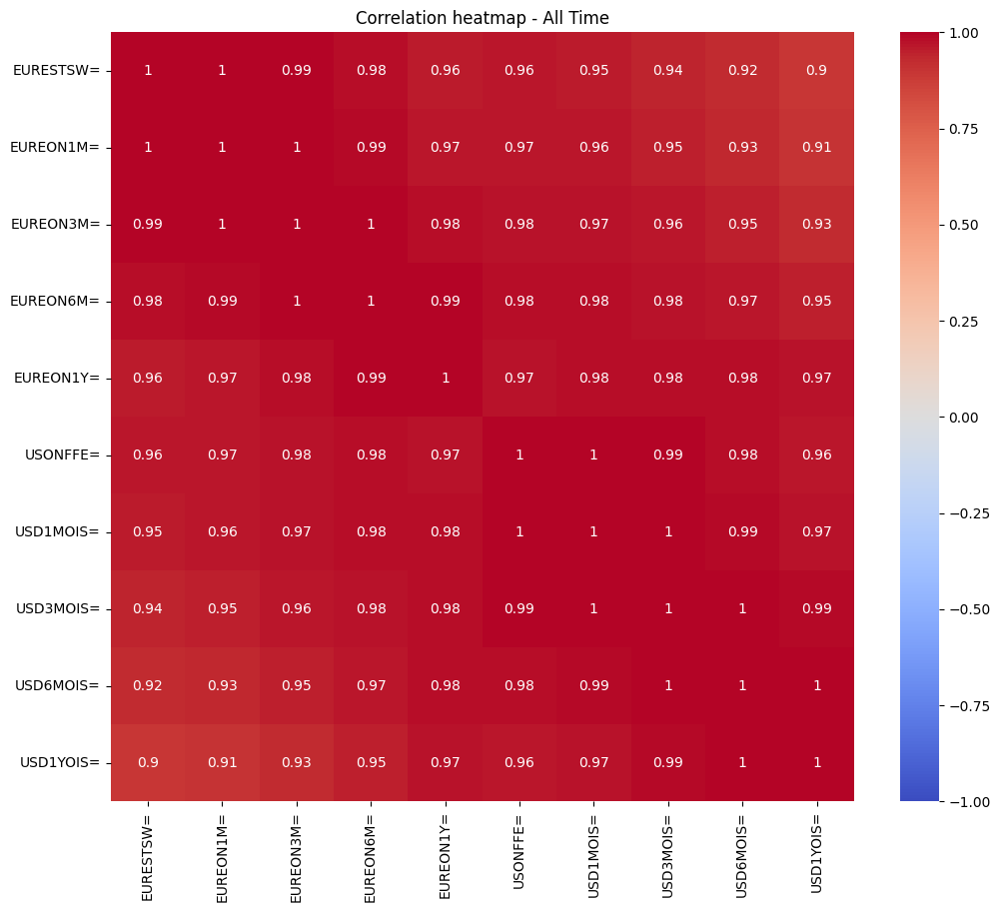


StockCommo Data


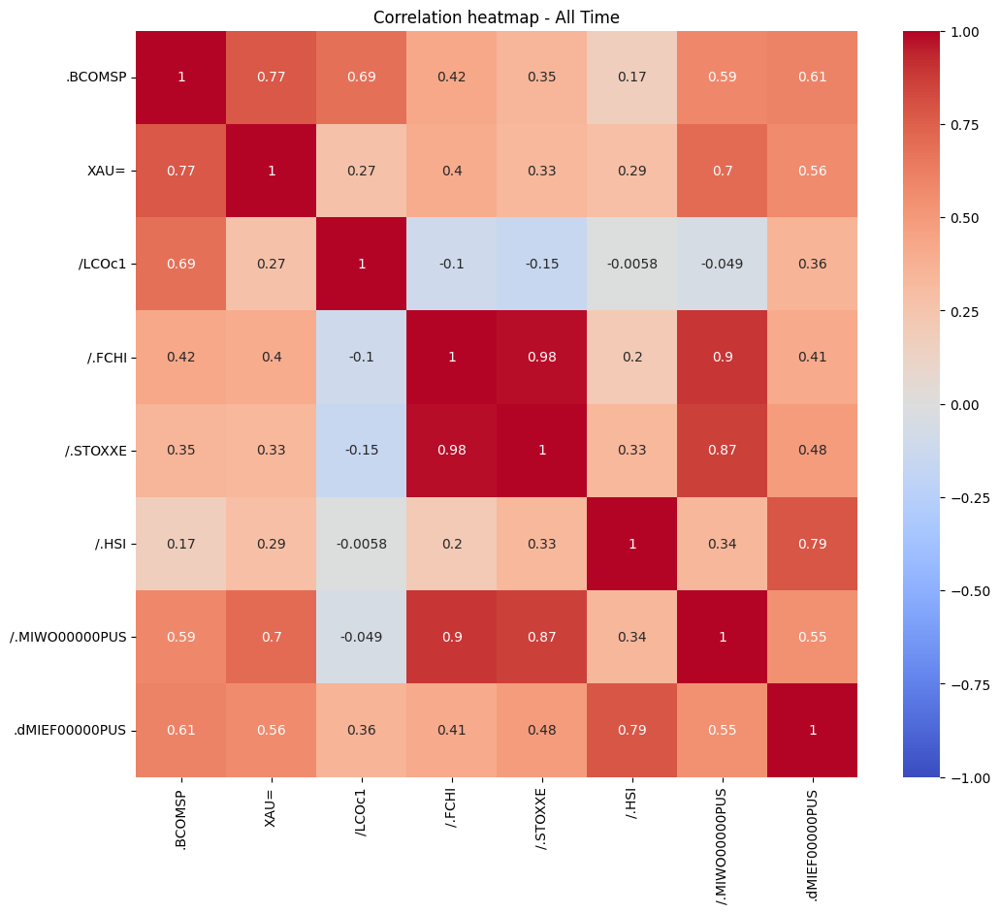


CDS Data


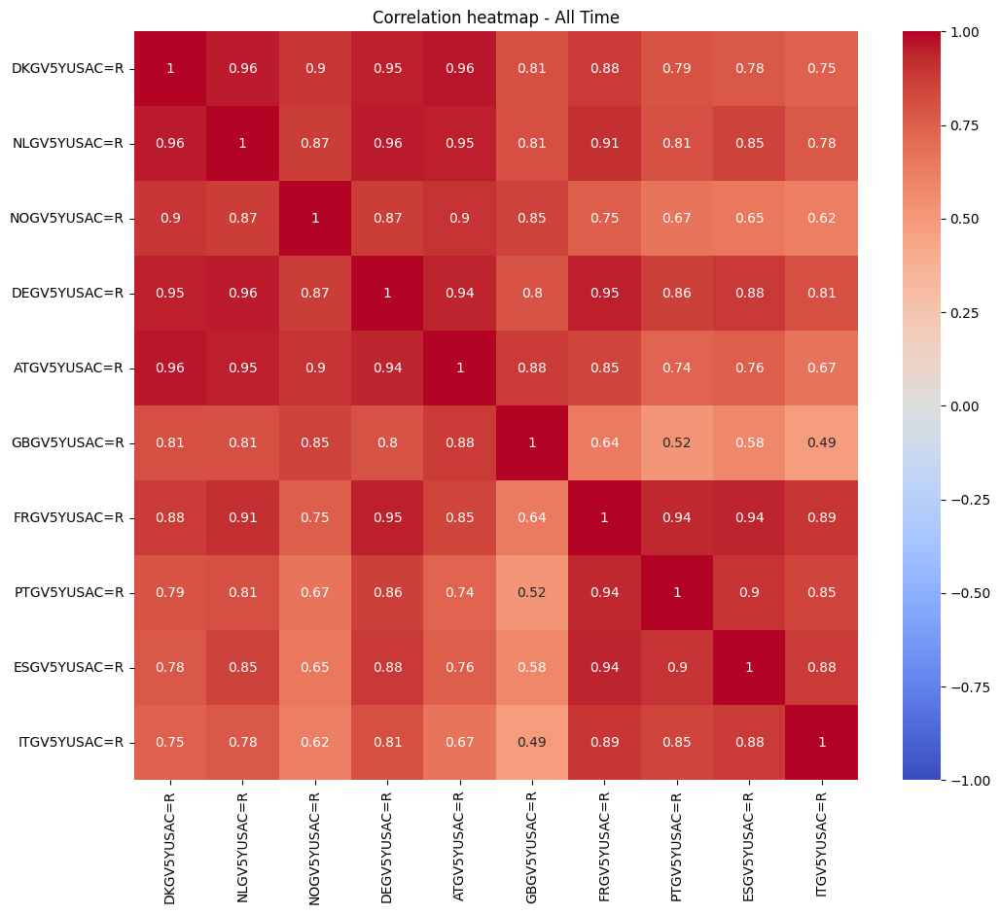

In [70]:
from datetime import datetime

# Function to calculate correlation matrix for a specific period
def calculate_correlation(data, period):
    if period == 'YTD':
        start_date = datetime(datetime.now().year, 1, 1)
    elif period == '3M':
        start_date = datetime.now() - pd.DateOffset(months=3)
    elif period == '1Y':
        start_date = datetime.now() - pd.DateOffset(years=1)
    else:
        start_date = data.index.min()

    filtered_data = data[data.index >= start_date]
    return filtered_data.corr()

# Function to plot correlation heatmap
def plot_correlation_heatmap(corr_matrix, period):
    plt.figure(figsize=(12, 10))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, vmin=-1, vmax=1)
    plt.title(f'Correlation heatmap - {period}')
    plt.show()

# Consolidate all dataframes into one dictionary for easier handling
data_dict = {
    'FX': FX_data,
    'Bond2Y': Bond2Y_data,
    'Bond10Y': Bond10Y_data,
    'MM': MM_data,
    'StockCommo': Stock_commo_data,
    'CDS': CDS_data
}

# Define periods for correlation analysis
periods = ['YTD', '3M', '1Y', 'All Time']

# Perform correlation analysis and plot heatmaps
for period in periods:
    print(f"\nCorrelation analysis - {period}")
    for name, data in data_dict.items():
        print(f"\n{name} Data")
        corr_matrix = calculate_correlation(data, period)
        plot_correlation_heatmap(corr_matrix, period)


In [44]:
# List of countries for which we have 10Y and 2Y bond data
countries = ["FR", "GB", "JP", "IT", "DE", "CA", "US", "SE", "BE", "NL"]

# Initialize a dictionary to hold the spreads
spreads = {}

# Calculate the spread for each country and store it in the dictionary
for country in countries:
    ten_year_ticker = f"{country}10YT=RR"
    two_year_ticker = f"{country}2YT=RR"
    spreads[country] = Bond10Y_data[ten_year_ticker] - Bond2Y_data[two_year_ticker]

# Convert the dictionary to a DataFrame
spread_data = pd.DataFrame(spreads)

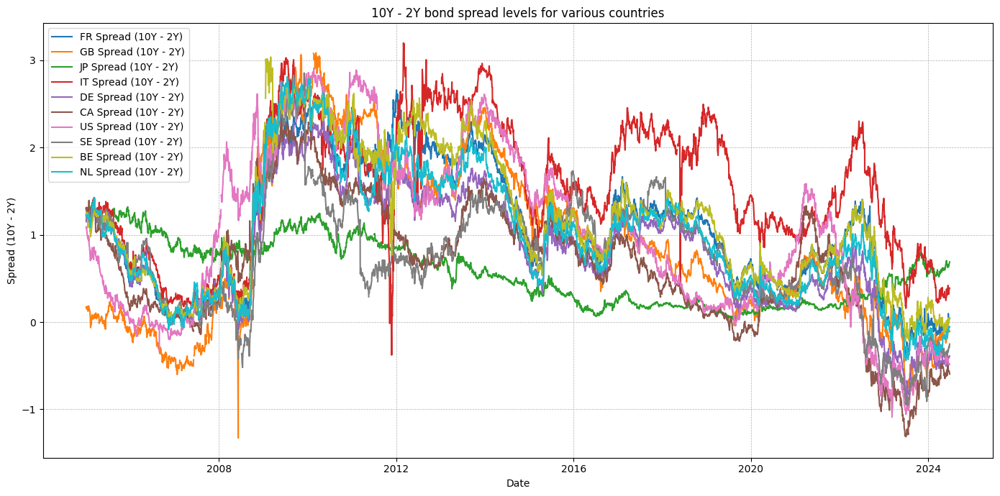

In [45]:
# Plot the spreads
plt.figure(figsize=(14, 7))

for country in countries:
    plt.plot(spread_data.index, spread_data[country], label=f"{country} Spread (10Y - 2Y)")

plt.title("10Y - 2Y bond spread levels for various countries")
plt.xlabel("Date")
plt.ylabel("Spread (10Y - 2Y)")
plt.legend(loc='upper left')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

# Function to plot individual country spreads
def plot_country_spread(spread_data, country):
    plt.figure(figsize=(14, 7))
    plt.plot(spread_data.index, spread_data[country], label=f"{country} Spread (10Y - 2Y)")
    plt.title(f"{country} 10Y - 2Y spread level")
    plt.xlabel("Date")
    plt.ylabel("Spread (10Y - 2Y)")
    plt.legend()
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

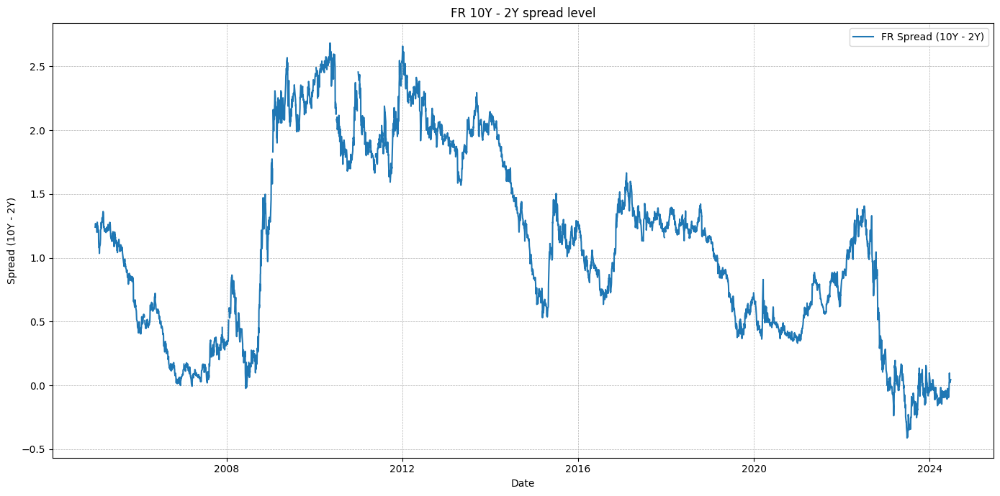

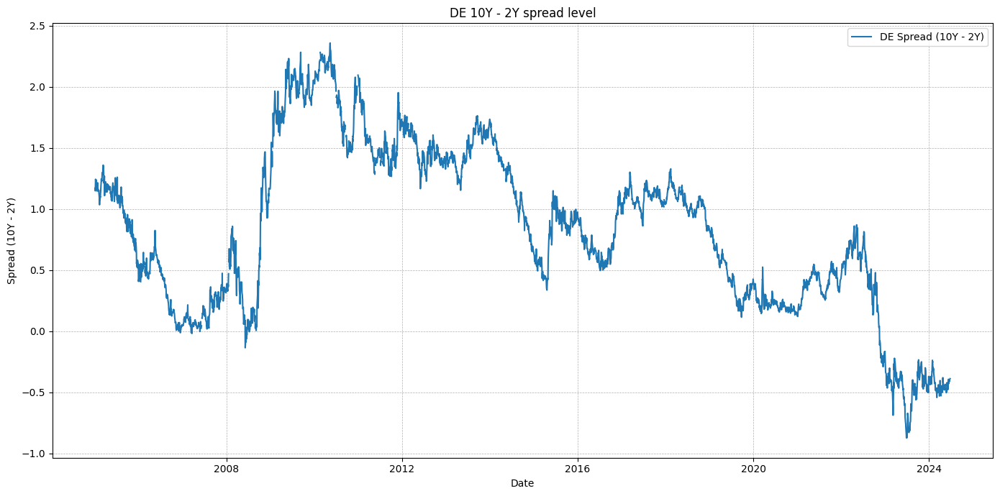

In [46]:
# Plot individual country spreads
plot_country_spread(spread_data, 'FR')
plot_country_spread(spread_data, 'DE')

In [48]:
# List of countries for which we have 10Y bond data (excluding Germany)
countries = ["FR", "GB", "JP", "IT", "CA", "US", "SE", "BE", "NL"]

# Initialize a dictionary to hold the spreads with respect to German 10Y bonds
german_spreads = {}

# German 10Y bond yield ticker
german_10y_ticker = "DE10YT=RR"

# Calculate the spread for each country with respect to German 10Y bonds
for country in countries:
    ten_year_ticker = f"{country}10YT=RR"
    german_spreads[country] = Bond10Y_data[ten_year_ticker] - Bond10Y_data[german_10y_ticker]

# Convert the dictionary to a DataFrame
german_spread_data = pd.DataFrame(german_spreads)

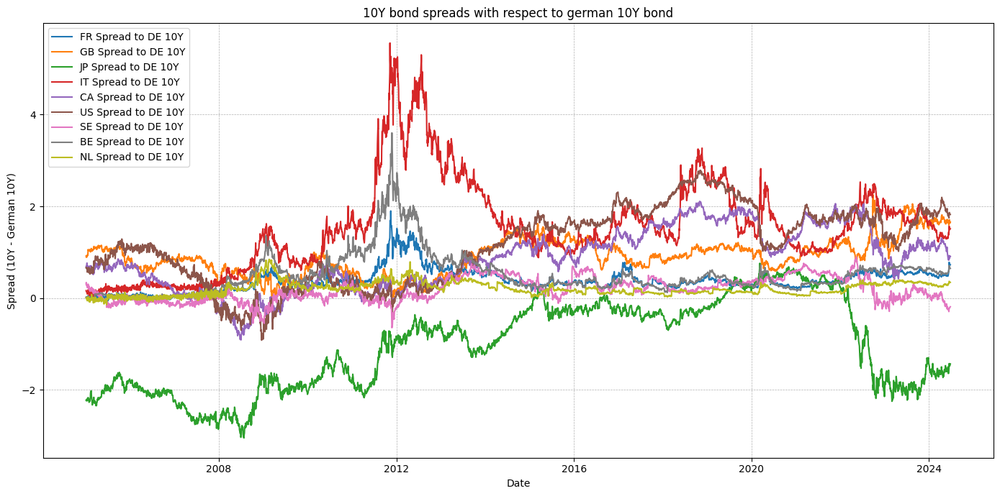

In [51]:
# Plot the spreads
plt.figure(figsize=(14, 7))

for country in countries:
    plt.plot(german_spread_data.index, german_spread_data[country], label=f"{country} Spread to DE 10Y")

plt.title("10Y bond spreads with respect to german 10Y bond")
plt.xlabel("Date")
plt.ylabel("Spread (10Y - German 10Y)")
plt.legend(loc='upper left')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

# Function to plot individual country spreads relative to German 10Y bond
def plot_country_german_spread(german_spread_data, country):
    plt.figure(figsize=(14, 7))
    plt.plot(german_spread_data.index, german_spread_data[country], label=f"{country} Spread to DE 10Y")
    plt.title(f"{country} 10Y spread to german 10Y bond")
    plt.xlabel("Date")
    plt.ylabel("Spread (10Y - German 10Y)")
    plt.legend()
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

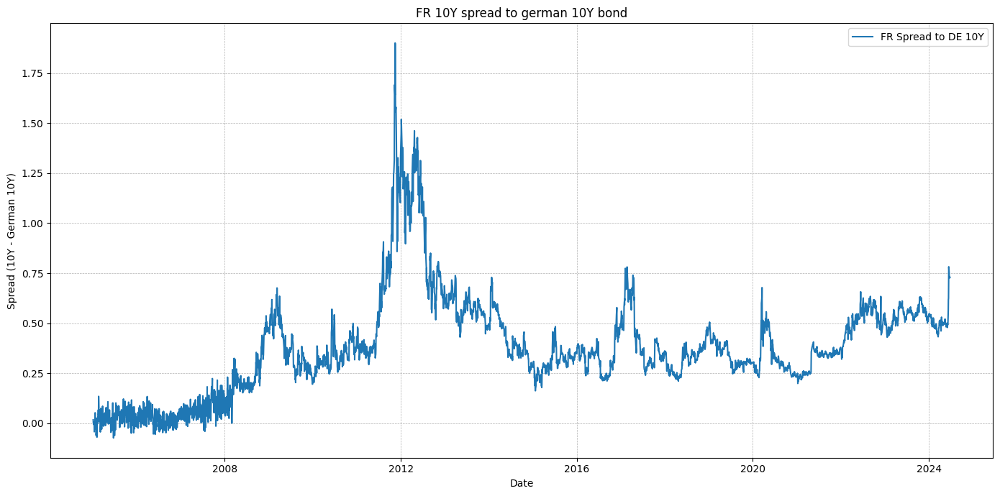

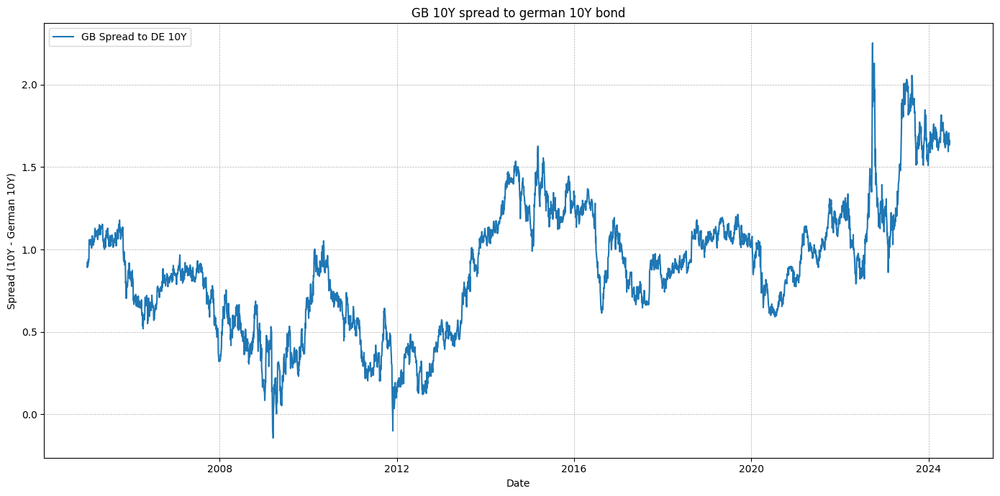

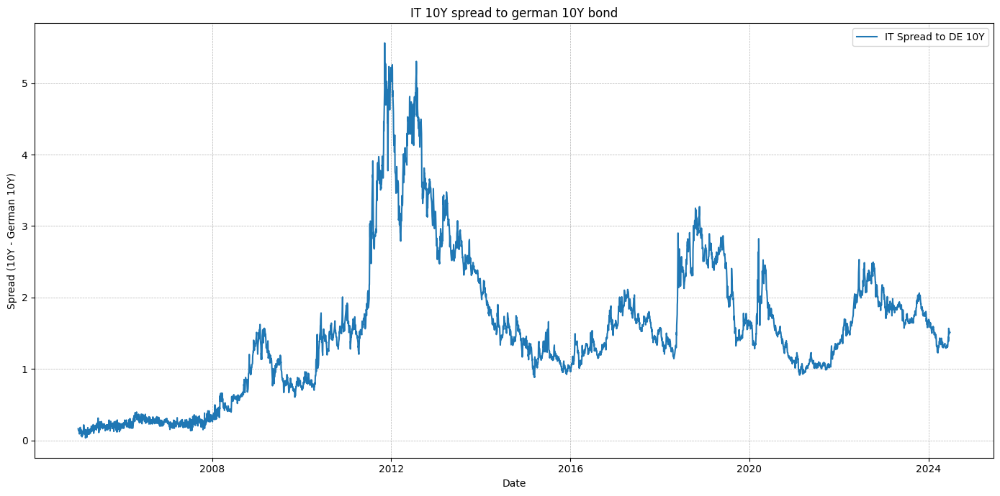

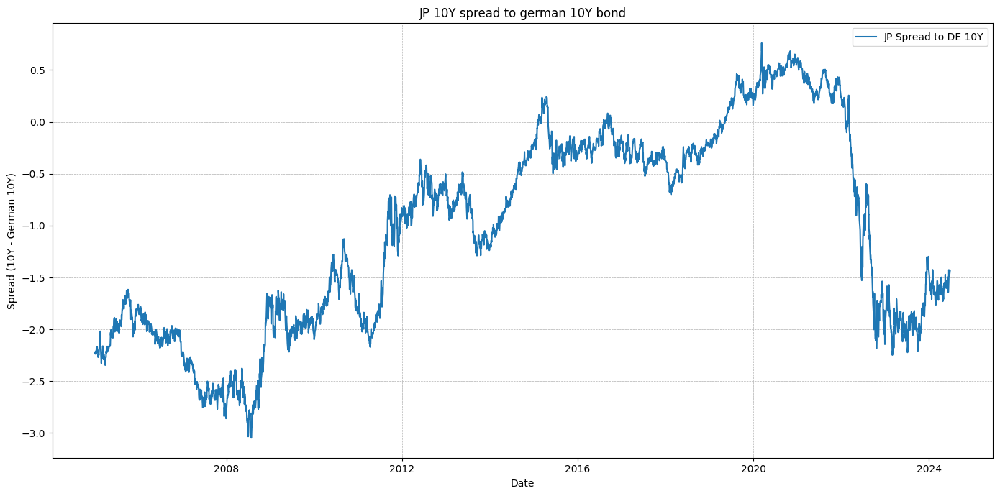

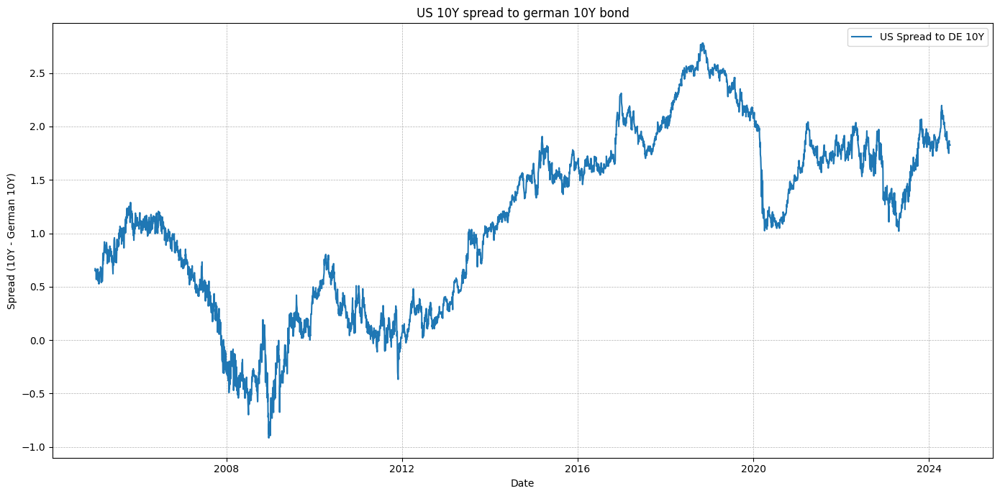

In [52]:
# Plot individual country spreads relative to German 10Y bond
plot_country_german_spread(german_spread_data, 'FR')
plot_country_german_spread(german_spread_data, 'GB')
plot_country_german_spread(german_spread_data, 'IT')
plot_country_german_spread(german_spread_data, 'JP')
plot_country_german_spread(german_spread_data, 'US')